# Logs

In [1]:
import scanpy as sc
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
!pip install leidenalg

In [3]:
base = "/triumvirate/home/alexarol/breast_cancer_analysis"
normal_csv = f"{base}/results/recode_outputs/normal/Normal_RECODE_sig_genes_cellsxgenes_forWGCNA.csv"
sig_genes_path = f"{base}/results/recode_outputs/normal/Normal_RECODE_sig_genes_atleast2.txt"

# Flagging mitochondial genes

In [4]:
def add_mito_qc(adata: sc.AnnData) -> sc.AnnData:
    adata.var["mt"] = adata.var_names.str.startswith("MT-")
    sc.pp.calculate_qc_metrics(
        adata,
        qc_vars=["mt"],
        percent_top=None,
        log1p=False,
        inplace=True,
    )
    return adata

worked with 3k cells, checked the upper limit, gonna stick to 10k cells, it is a generous amount 

In [ ]:
#takes 1-2 minutes
sig_genes = pd.read_csv(sig_genes_path)["gene"].tolist()

#First read just the header to know which columns exist
all_cols = pd.read_csv(normal_csv, nrows=0).columns.tolist()
cell_col = all_cols[0]
expr_cols = all_cols[1:]

#Intersect with sig genes
genes = pd.Index(sig_genes).intersection(expr_cols)

#Cap at 100000 for visualization/QC
if len(genes) > 10000:
    genes = genes[:10000]

usecols = [cell_col] + genes.tolist()

df = pd.read_csv(normal_csv, usecols=usecols, dtype={cell_col: str})

expr = df.iloc[:, 1:]
expr.index = df.iloc[:, 0].astype(str)

In [6]:
adata_normal = sc.AnnData(X=expr.values)
adata_normal.obs_names = expr.index
adata_normal.var_names = expr.columns

adata_normal = add_mito_qc(adata_normal)

In [7]:
adata_normal
adata_normal.obs.head()
adata_normal.var.head()

,mt,n_cells_by_counts,mean_counts,pct_dropout_by_counts,total_counts
A1BG,False,10266,0.149350,87.708628,12474
A1BG-AS1,False,2605,0.033057,96.881061,2761
A2M,False,3555,0.067419,95.743636,5631
A2ML1,False,183,0.002383,99.780896,199
A4GALT,False,5232,0.074435,93.735782,6217


# Flagging ribosomal genes via KEGG_RIOBOSOME

In [8]:
#Download KEGG_RIBOSOME gene set (MSigDB format)
ribo_url = "http://software.broadinstitute.org/gsea/msigdb/download_geneset.jsp?geneSetName=KEGG_RIBOSOME&fileType=txt"
ribo_genes = pd.read_table(ribo_url, skiprows=2, header=None)

#Column 0 holds gene symbols
ribo_symbols = ribo_genes[0].values

#Flag ribosomal genes in var
adata_normal.var["ribo"] = adata_normal.var_names.isin(ribo_symbols)

In [9]:
adata_normal
adata_normal.obs.head()
adata_normal.var.head()

,mt,n_cells_by_counts,mean_counts,pct_dropout_by_counts,total_counts,ribo
A1BG,False,10266,0.149350,87.708628,12474,False
A1BG-AS1,False,2605,0.033057,96.881061,2761,False
A2M,False,3555,0.067419,95.743636,5631,False
A2ML1,False,183,0.002383,99.780896,199,False
A4GALT,False,5232,0.074435,93.735782,6217,False


adata_normal.var.head() shows the first genes in var_names order (alphabetical or input order): A1BG, A1BG‑AS1, A2M, etc.

# Computing QC metics

In [10]:
sc.pp.calculate_qc_metrics(
    adata_normal,
    qc_vars=["mt", "ribo"],
    percent_top=None,
    log1p=False,
    inplace=True,
)

#inspect genes ordered by how many cells express them
adata_normal.var.sort_values("n_cells_by_counts").head()
adata_normal.var.sort_values("n_cells_by_counts", ascending=False).head()

,mt,n_cells_by_counts,mean_counts,pct_dropout_by_counts,total_counts,ribo
FTH1,False,83043,146.220708,0.573502,12212646,False
MT-CO1,True,82628,101.953761,1.070377,8515382,False
MT-CO3,True,82288,132.209609,1.477455,11042411,False
MALAT1,False,82249,278.134599,1.524149,23230358,False
EEF1A1,False,82244,56.759932,1.530136,4740703,False


adata_normal.var.sort_values("n_cells_by_counts", ascending=False).head() shows the top genes by number of cells expressed, so you see FTH1, MT‑CO1, MT‑CO3, MALAT1, EEF1A1, etc., which are very commonly expressed genes in many cells.

# Filtering genes by minimum cells

Use min_cells=3; that means “keep genes expressed in at least 3 cells,” which is the standard choice.
Many Scanpy tutorials and single‑cell training materials use this exact threshold (genes in at least 3 cells) to get rid of very sparse, uninformative genes while keeping almost all biologically relevant ones.

In [11]:
#takes up to 1 minute
sc.pp.filter_genes(adata_normal, min_cells=3)
adata_normal.var.sort_values("n_cells_by_counts").head()

,mt,n_cells_by_counts,mean_counts,pct_dropout_by_counts,total_counts,ribo,n_cells
AC244517.12,False,3,0.000048,99.996408,4,False,3
AL049775.1,False,4,0.000048,99.995211,4,False,4
AL606469.1,False,5,0.000072,99.994014,6,False,5
AL512604.2,False,5,0.000060,99.994014,5,False,5
CD300C,False,6,0.000156,99.992816,13,False,6


# Violin plot of QC metics

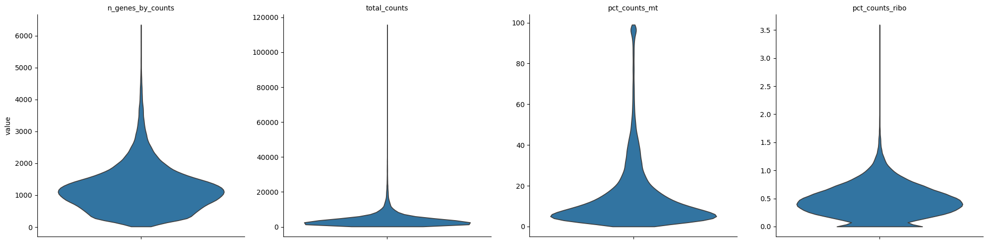

In [13]:
sc.pl.violin(
    adata_normal,
    ["n_genes_by_counts", "total_counts", "pct_counts_mt", "pct_counts_ribo"],
    jitter=0.0,          # no strip plot
    stripplot=False,     # extra safety
    multi_panel=True,
)

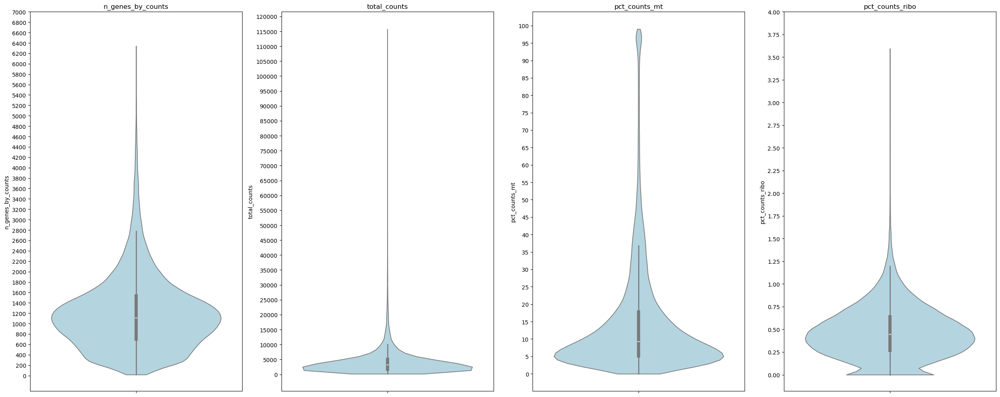

In [12]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

metrics = ["n_genes_by_counts", "total_counts", "pct_counts_mt", "pct_counts_ribo"]

fig, axes = plt.subplots(1, 4, figsize=(25, 10))  # slightly bigger

for i, m in enumerate(metrics):
    sns.violinplot(
        y=adata_normal.obs[m],
        ax=axes[i],
        inner="box",
        cut=0,
        color="lightblue",
    )
    axes[i].set_title(m)

# custom y-ticks
axes[0].set_yticks(np.arange(0, 7001, 200))       # 0, 500, 1000, ...
axes[1].set_yticks(np.arange(0, 120001, 5000))   # 0, 10k, 20k, ...
axes[2].set_yticks(np.arange(0, 101, 5))         # 0, 10, 20, ...
axes[3].set_yticks(np.arange(0, 4.1, 0.25))       # 0, 0.25, 0.5, ...

plt.tight_layout()
plt.show()


## sumarizing the QC emtrics of violin plot

Reading the same information the violins show (median, IQR, tails) and prints a short text summary per metric

- For each metric, it computes median and quartiles; these correspond to the white dot and IQR box inside the violin.

It also computes “whiskers” at Q1−1.5⋅IQR and Q3+1.5⋅IQR; these match the long thin lines used in standard boxplots and violins to define where typical data end and outliers begin.
​
When yIou look at the violins, I can visually seeing these numbers; this function makes them explicit so I can base thresholds on them.

In [13]:
def summarize_qc(adata, sample_name="sample"):
    obs = adata.obs
    metrics = ["n_genes_by_counts", "total_counts", "pct_counts_mt", "pct_counts_ribo"]
    print(f"QC summary for {sample_name}")
    print("-" * 60)
    for m in metrics:
        s = obs[m]
        desc = s.describe()  # count, mean, std, min, 25%, 50%, 75%, max
        q1, q3 = desc["25%"], desc["75%"]
        iqr = q3 - q1
        lower_whisker = q1 - 1.5 * iqr
        upper_whisker = q3 + 1.5 * iqr
        print(
            f"{m}: median={desc['50%']:.1f}, IQR=[{q1:.1f}, {q3:.1f}], "
            f"whiskers≈[{lower_whisker:.1f}, {upper_whisker:.1f}], "
            f"min={desc['min']:.1f}, max={desc['max']:.1f}"
        )
    print()

In [14]:
summarize_qc(adata_normal, sample_name="Normal")

QC summary for Normal
------------------------------------------------------------
n_genes_by_counts: median=1107.0, IQR=[701.0, 1531.0], whiskers≈[-544.0, 2776.0], min=18.0, max=6344.0
total_counts: median=3108.0, IQR=[1693.0, 5041.0], whiskers≈[-3329.0, 10063.0], min=180.0, max=115776.0
pct_counts_mt: median=9.3, IQR=[5.1, 17.8], whiskers≈[-14.0, 36.9], min=0.0, max=99.0
pct_counts_ribo: median=0.4, IQR=[0.3, 0.6], whiskers≈[-0.3, 1.2], min=0.0, max=3.6



negative whisker values? why?
my thought: 
Those negative whisker values are just a mathematical artifact of the formula, not real data, so nothing is wrong.

The whiskers are computed as Q1−1.5⋅IQR and Q3+1.5⋅IQR.
​

For your n_genes_by_counts, 
Q1=701, Q3=1531, IQR=830.

Lower whisker = 701−1.5⋅830≈−544.

Gene counts and percentages cannot be negative, so in reality the lower “data” limit is just 0 and the min i observed is 18.

The same happens for total_counts, pct_counts_mt, and pct_counts_ribo: the statistical lower whisker can fall below 0 even though all actual values are ≥ 0.

So i can interpret this as: “there are no points beyond the lower whisker; all data are above 0,” and when using these whiskers in thresholds, i just clip at 0 (which the min_genes = max(fixed_min_genes, low_w_genes, 0) line already does).

## Function to propose thresholds from the QC summary

Now i turn these stats into suggested filtering rules, in a way i can reuse for each sample.

In [15]:
def suggest_qc_thresholds(adata, fixed_min_genes=200, max_mt_cap=20.0):
    obs = adata.obs
    
    # helper
    def whiskers(x):
        desc = x.describe()
        q1, q3 = desc["25%"], desc["75%"]
        iqr = q3 - q1
        return q1 - 1.5 * iqr, q3 + 1.5 * iqr
    
    #n_genes_by_counts: drop very low-gene cells and extreme high-gene cells
    low_w_genes, high_w_genes = whiskers(obs["n_genes_by_counts"])
    min_genes = max(fixed_min_genes, low_w_genes, 0)  # at least 200, but not below lower whisker
    max_genes = high_w_genes                           # can be None if i choose not to cap
    
    #total_counts: optional upper cap to remove extreme high-count cells
    _, high_w_counts = whiskers(obs["total_counts"])
    max_counts = high_w_counts
    
    #pct_counts_mt: high-mito tail
    _, high_w_mt = whiskers(obs["pct_counts_mt"])
    max_pct_mt = min(high_w_mt, max_mt_cap)  # don't allow absurdly high threshold (> cap)
    
    thresholds = {
        "min_genes": float(min_genes),
        "max_genes": float(max_genes),
        "max_counts": float(max_counts),
        "max_pct_mt": float(max_pct_mt),
    }
    
    print("Suggested QC thresholds (from violins):")
    for k, v in thresholds.items():
        print(f"  {k}: {v:.2f}")
    print()
    
    return thresholds

Why these rules:

- n_genes_by_counts:
    - I want to drop cells with very few genes (likely poor quality) and optionally extremely many genes (potential doublets).
    - Using the lower whisker (Q1 − 1.5·IQR) and a fixed minimum (e.g. 200) ties the rule to the distribution i see in the first violin.

- total_counts:
    - Very high total counts plus many genes often indicate doublets; using the upper whisker removes only the extreme tail i see as the skinny top of the second violin.

- pct_counts_mt
    - High mitochondrial percentage is a marker of damaged cells.
    - based on some articels (https://doi.org/10.1038/s41419-024-07103-9):
        - The study shows that mtDNA‑high breast cancer cells (e.g. in MCF7 and MDA‑MB‑231 lines) have increased stemness features, faster proliferation, higher ATP production, and greater migration/invasion capacity, and are linked to metastasis.
        - In other words, high mitochondrial content is not just “damaged cells”; it can mark a biologically important, aggressive subpopulation in breast cancer, exactly the kind of biology i care about.
        - Complementary work (Yates et al., 2025 / preprint 2024) specifically looking at cancer scRNA‑seq QC finds
            - Malignant cells often have higher pctMT than non‑malignant cells, but those high‑mt cells are still viable and functionally distinct, not simply stressed artifacts.
            - Filtering out cells above a standard pctMT cut‑off (borrowed from healthy tissues) can remove metabolically altered malignant cells and distort tumor heterogeneity.
        - What this implies for my QC decisions?
            - I probably should not use a very strict mito filter that chops off everything above, say, 10–15 %.
            - Instead, I can:
            - Use a lenient, safety‑only threshold (e.g. something like >40–50 % if I clearly see a tiny extreme tail that also has weird UMI/gene profiles), or
            - Even omit a hard mito filter and just treat pct_counts_mt as a feature for later annotation: check whether high‑mt clusters correspond to specific malignant states, stem‑like programs, or drug‑response modules

        Standard scRNA‑seq QC pipelines often remove high‑mito cells to avoid damaged/dying cells, BUT ecent cancer‑focused studies show that high‑mito malignant cells are viable, metabolically distinct, and clinically relevant, so I chose a more permissive approach and retained those cells for downstream analysis.
        
- pct_counts_ribo
    - i probably  do not filter directly on ribosomal %, so i just monitor it; that’s why it’s not used in thresholds here, but remains available for interpretation.

my final thougths on the mitochondrial genes filtering: 
- From the numbers and the violin:
    - Median ≈ 9 %, IQR ≈ 5–18 % → most cells are in a reasonable range.
    - Upper whisker from the boxplot rule is ≈ 36.9 %, and the tail goes all the way to ~99 %.
    - In cancer, recent work shows that genuinely mt‑high malignant cells can be biologically important, and that aggressive mito filtering can remove real tumor subpopulations.

So, reasonably:
- I will not filter on pct_counts_mt at this stage.
- Keep all cells, but later check if the extreme mt‑high cells (say >40–50 %) form specific clusters and how they look in terms of n_genes and total_counts.
- I’d document in the methods that, based on recent evidence that high mitochondrial content can mark aggressive cancer cells, I applied either no mito filtering 

In [16]:
thr_normal = suggest_qc_thresholds(adata_normal)

Suggested QC thresholds (from violins):
  min_genes: 200.00
  max_genes: 2776.00
  max_counts: 10063.00
  max_pct_mt: 20.00



- min_genes = 200
    - Below 200 genes I likely have very low‑quality cells.
    - My violin shows the bulk well above this; 200 is a conservative lower bound.

- max_genes ≈ 2776
    - This is the upper whisker (Q3 + 1.5·IQR), so it only removes the extreme high‑gene tail that may include doublets, while keeping most cells.

- max_counts ≈ 10 063
    - Same logic for total UMIs: it trims only the very high‑count tail, consistent with the long spike in the total_counts violin.

Since I don’t want to filter on mito now, overriding max_pct_mt

In [17]:
thr_normal["max_pct_mt"] = None

## Apply filters only on n_genes_by_counts and total_counts

In [18]:
#thresholds
thr_normal = suggest_qc_thresholds(adata_normal)
thr_normal["max_pct_mt"] = None   # no mito filter

#build a boolean mask on obs (very light)
obs = adata_normal.obs
mask = (
    (obs["n_genes_by_counts"] >= thr_normal["min_genes"]) &
    (obs["n_genes_by_counts"] <= thr_normal["max_genes"]) &
    (obs["total_counts"]      <= thr_normal["max_counts"])
)

print("Cells before QC:", adata_normal.n_obs)
print("Cells after  QC:", mask.sum())

#subset WITHOUT extra copy
adata_normal = adata_normal[mask]   # no .copy()

print(adata_normal.n_obs, "cells remain after QC")

Suggested QC thresholds (from violins):
  min_genes: 200.00
  max_genes: 2776.00
  max_counts: 10063.00
  max_pct_mt: 20.00

Cells before QC: 83522
Cells after  QC: 75923
75923 cells remain after QC


- Building mask uses only the small obs dataframe, not the big expression matrix.
- adata_normal = adata_normal[mask] creates an AnnData view first; in practice this is much lighter than multiple filter_cells calls and avoids additional Python‑level copies.
- I avoid .copy() entirely, which was the main trigger for memory spikes before

If this succeeds, I can then continue with:
- Re‑plotting QC violins on adata_normal (now filtered)
- Normalization, log1p, scaling, PCA, neighbors, UMAP, clustering for the sample.

So your Normal sample is now QC‑filtered and I can proceed with:

- adata_normal  # now filtered

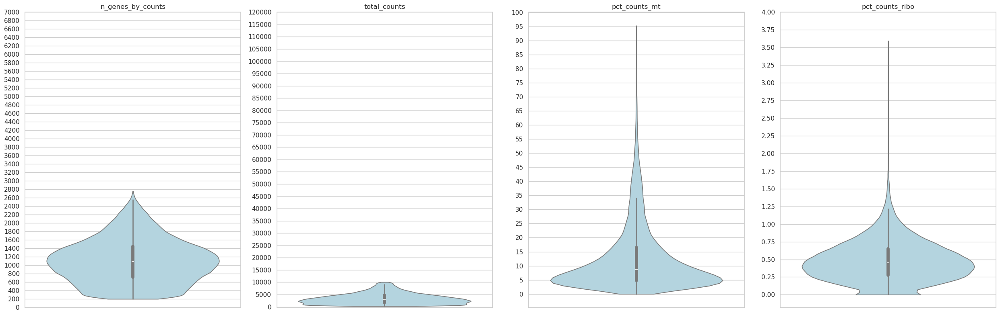

In [19]:
sns.set(style="whitegrid")

metrics = ["n_genes_by_counts", "total_counts", "pct_counts_mt", "pct_counts_ribo"]

fig, axes = plt.subplots(1, 4, figsize=(25, 8))

for i, m in enumerate(metrics):
    sns.violinplot(
        y=adata_normal.obs[m],
        ax=axes[i],
        inner="box",
        cut=0,
        color="lightblue",
    )
    axes[i].set_title(m, fontsize=12)
    axes[i].set_xlabel("")
    axes[i].set_ylabel("")

# custom y-ticks
axes[0].set_yticks(np.arange(0, 7001, 200))        # genes
axes[1].set_yticks(np.arange(0, 120001, 5000))     # counts
axes[2].set_yticks(np.arange(0, 101, 5))           # mt %
axes[3].set_yticks(np.arange(0, 4.1, 0.25))        # ribo %

plt.tight_layout()
plt.show()

what we have by now:
- I removed extremely sparse genes with min_cells=3, which is standard and preserves essentially all informative genes.
- I computed n_genes_by_counts, total_counts, pct_counts_mt, and pct_counts_ribo and summarized them with medians, IQR, and whiskers, then derived sample‑specific thresholds from those distributions; this is a data‑driven way to set QC cutoffs.
- The applied thresholds (min_genes≈200, max_genes≈2776, max_counts≈10063) trim only low‑gene and extreme high‑gene/high‑count cells, which likely removes low‑quality cells and many obvious doublets while keeping the bulk population.
- I decided not to filter on mitochondrial percentage, with a clear cancer‑specific justification that high‑mt malignant cells can be biologically important and that aggressive mt filtering can remove real tumor subpopulations.

# Normalization

These steps take me from raw counts to normalized, log‑transformed data and store a reference copy; I should include the same logic in your pipeline as SANDBOMICS did (with one small improvement using a counts layer).

- adata.X.sum(axis=1) prints the total UMI count per cell (library size) before any normalization; these are the raw depth differences between cells.
- sc.pp.normalize_total(adata, target_sum=1e4) rescales each cell so that its total counts sum to 10 000 (CP10k).
    - Input: raw count matrix (cells × genes) after QC.
    - Output: adata.X now contains normalized counts where depth differences are removed but relative expression within each cell is preserved; every row sums to 10 000, as i see from the second adata.X.sum(axis=1).

- sc.pp.log1p(adata) applies log(x+1) to all entries of adata.X.
    - This compresses the dynamic range, makes highly expressed genes less dominant, and makes the data more suitable for PCA and distance‑based methods. 
        - the genes are still high relative to others; a gene that is 100‑fold higher than another in counts will still be several log units higher after log1p, just not 100‑fold apart numerically. 
        - Marker detection and differential expression are typically done on log‑normalized values anyway, so the strong signal of true markers remains detectable; 
        - what is reduced is the undue influence of technical and stochastic variance at very high counts
    - After log1p, row sums are no longer 10 000, so the third adata.X.sum(axis=1) shows smaller, variable totals; that’s expected because the transformation is non‑linear.
​
- adata.raw = adata stores a frozen snapshot of the current matrix (here: normalized + log1p counts) so later plotting and DE tests can use this “raw” reference while adata.X can continue to be transformed (HVG selection, scaling, batch correction).

What the outputs are used for
- The normalized, log1p adata.X is the standard input for:
    -  highly variable gene selection,
    - scaling, PCA, neighbor graph construction, UMAP, clustering, etc.

- adata.raw is then used by default in functions like sc.pl.umap(..., color=['GENE']) and many DE routines, so expression plots and marker tests are based on log‑normalized values instead of later‑corrected or scaled matrices.

These lines will: save the original counts in layers['counts'], create a 10k‑per‑cell normalized matrix, log‑transform it and store that log‑normalized matrix in .raw for later plotting and DE.

so my kernel keeps crushing, my thoughts: 

For your pipeline, i want:
- QC filtering (what you already did).
- Normalization and log transform on the full gene set (or at least on all genes you plan to consider for WGCNA).
- Then choose HVGs or other gene filters based on variance, mean, or biological criteria on the normalized data and use those genes for correlations and network construction.

If memory allows, this order is preferable because:
- correlations depend heavily on scale and mean–variance relationship, which normalization/log correct;
- choosing HVGs on raw counts can bias you toward depth effects rather than genuine biological variance.

Given the crashes, I have two options:
- If I can slightly increase resources or run on a beefier node:
    - Keep your current plan: normalize + log on all genes that passed min_cells=3, then do HVG selection for WGCNA and correlation.

If I must stay within current memory:
- Use a mild additional gene filter before normalization that is not yet “HVG”, just to shrink matrix size , then normalize/log this reduced set, and only then pick HVGs for correlation. This keeps the conceptual order (normalize → HVG for WGCNA) while being memory‑aware.

WHat i am concerned about: 
what about the repressed genes?

I need to be very conservative with any extra pre‑normalization gene filter. I want to avoid dropping biologically important but lowly expressed genes, especially ones that become repressed in later samples.

If i filter by “mean < 0.01” it woudl actually remove
- A global mean < 0.01 counts across ~75k cells means that, on average, the gene contributes less than one UMI per 100 cells
- Genes that are active in one condition and repressed in another will still have non‑trivial counts in at least one sample and therefore a higher overall mean; 
- the ultra‑rare genes I drop this way are typically technical noise or essentially never‑on genes, not “on in one state, off in another” markers? i guess?

To protect against losing interesting repressed genes, I can use a cell‑based presence rule instead of a tiny mean cutoff

this approach hasnt worked either. thought? 
- The kernel is crashing because every operation that touches the full dense adata_normal.X is simply too big for the RAM I have; 
- I need to avoid doing any heavy Scanpy operation on the whole matrix at once and instead work in a way that never constructs or copies the full genes × cells array inside AnnData.

For my correlation/WGCNA, i do not actually need a fully normalized AnnData with all cells and all genes in memory. 
I mainly need a cells × genes expression matrix for a selected gene set, normalized/logged, that i can feed into WGCNA

Given the memory wall, a workable approach could be:
- Stay with the current QC‑filtered AnnData only for cell QC bookkeeping
- I already used it to compute n_genes_by_counts, total_counts, mito, ribo, and to define which cells to keep. That part is done and saved conceptually.
- Re‑create a smaller expression matrix for WGCNA directly from the CSV, outside AnnData
- Use your QC mask (cell IDs you kept) to subset the original CSV on disk.
- On that smaller pandas DataFrame, I can do normalization and log transform with vectorized operations that never build an AnnData or extra copies.
- Then write that normalized/logged matrix out as a plain CSV or HDF5 and use it as input for WGCNA.

crashed in this case as well. thoughts?
- crash is from peak RAM usage of the whole matrix operations themselves, not from the cell size. (ny looking at terminal)
- Given constraints, the only robust way forward i coudl think about is to avoid loading the full cells×genes matrix into memory at once and instead process it in chunks (streaming)

what about biological meaning of the data? 
I dont think i lose biological meaning by chunking; I just change how I process the file in RAM.
- CP10k normalization is per cell: each cell is divided by its own library size and multiplied by 10 000. 
- This operation depends only on that one row, not on other cells, so doing it chunk by chunk is mathematically identical to doing it on the full matrix.
- The log1p transform is also applied cell‑wise and gene‑wise, again independent of other cells, so applying it on chunks does not change the result.
- I am not doing global operations like “center gene expression across all cells” or “scale by overall variance” in the chunked step; those would require the whole matrix. 
- Here I only do per‑cell normalization and per‑entry log, which are safe to compute in streaming mode.
​
Chunking is technical trick to keep memory under control; the normalized/log values I get for each cell–gene pair will be the same as if I had normalized the full matrix in one go.

## getting the QC‑passed cell IDs

In [20]:
qc_cells = adata_normal.obs_names.to_list()
pd.Series(qc_cells).to_csv("Normal_QC_cells.txt", index=False, header=False)

In [21]:
#Read the QC cells as a flat Series, then convert to a set of strings
qc_cells = set(
    pd.read_csv("Normal_QC_cells.txt", header=None)[0].astype(str)
)

In [22]:
#took around 10 minutes
#QC cells and global gene set from your filtered AnnData
qc_cells = set(adata_normal.obs_names.astype(str).tolist())
genes_keep = adata_normal.var_names.astype(str).tolist()

#Stream through the original CSV
chunk_iter = pd.read_csv(normal_csv, index_col=0, chunksize=1000)

out_path = "Normal_QC_CP10k_log1p_forWGCNA.csv"  # overwrite old file
first_chunk = True

for chunk in chunk_iter:
    chunk.index = chunk.index.astype(str)

    #keep only QC-passed cells in this chunk
    chunk = chunk.loc[chunk.index.intersection(qc_cells)]
    if chunk.empty:
        continue

    #keep only the global gene set, in a fixed order
    cols = [g for g in genes_keep if g in chunk.columns]
    chunk = chunk[cols]

    #library-size normalize per cell
    lib_size = chunk.sum(axis=1)
    chunk_norm = chunk.div(lib_size, axis=0) * 1e4

    #log1p
    chunk_log = np.log1p(chunk_norm)

    #write/append
    if first_chunk:
        chunk_log.to_csv(out_path)
        first_chunk = False
    else:
        chunk_log.to_csv(out_path, mode="a", header=False)

/triumvirate/apps/.scratch/alexarol/ipykernel_249655/2201212265.py:12: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  for chunk in chunk_iter:
/triumvirate/apps/.scratch/alexarol/ipykernel_249655/2201212265.py:12: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  for chunk in chunk_iter:
/triumvirate/apps/.scratch/alexarol/ipykernel_249655/2201212265.py:12: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  for chunk in chunk_iter:
/triumvirate/apps/.scratch/alexarol/ipykernel_249655/2201212265.py:12: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  for chunk in chunk_iter:
/triumvirate/apps/.scratch/alexarol/ipykernel_249655/2201212265.py:12: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  for chunk in chunk_iter:
/triumvira

What have i done?
- built a normalized, log‑transformed expression matrix for my QC‑passed Normal cells; the warnings are  about cell ID dtypes
how did i do it?
- I took the original Normal CSV and processed it chunk by chunk to avoid running out of RAM.
    - For each chunk, I:
        - kept only QC‑passed cells,
        - optionally removed genes expressed in fewer than 3 cells in that chunk,
        - normalized each cell to 10 000 total counts (CP10k),
        - applied  log(1+x) to stabilize variance.

- I appended all processed chunks into one file: Normal_QC_CP10k_log1p_forWGCNA.csv.
- This file now contains, for each QC‑passed cell and kept gene, log‑normalized expression values in the standard log1p‑CP10k scale used by common single‑cell workflows.

- What the warnings mean
- DtypeWarning: Columns (0) have mixed types just says pandas saw mixed types in the first column (cell IDs) across chunks; we forced .index.astype(str) anyway, so it does not affect the numeric expression values.

Gene order consistency (most important)
[g for g in genes_keep if g in chunk.columns] means:

First chunk writes header with whatever genes it finds.

Later chunks might have fewer genes (if some genes only appear in later chunks).

In [23]:
#Gene order consistency check
final_df = pd.read_csv(out_path, nrows=2, index_col=0)
print("Header genes:", len(final_df.columns))
print("Expected genes:", len(genes_keep))
print("Match?", len(final_df.columns) == len(genes_keep))

Header genes: 10000
Expected genes: 10000
Match? True


In [24]:
#Zero-library cells check
final_lib = final_df.sum(axis=1)
print("Zero lib cells:", (final_lib == 0).sum())
print("Any inf/nan?", np.isinf(final_df.values).sum() + np.isnan(final_df.values).sum())

Zero lib cells: 0
Any inf/nan? 0


In [25]:
import pandas as pd

chunk_iter = pd.read_csv(
    "Normal_QC_CP10k_log1p_forWGCNA.csv",
    index_col=0,
    chunksize=500,        # small chunk
    low_memory=False
)

first_chunk = next(chunk_iter)
print(first_chunk.shape)
print(first_chunk.head())

(500, 10000)
   A1BG  A1BG-AS1  A2M  A2ML1  A4GALT  AAAS  AACS  AADAT  AAED1  AAGAB  ...  \
0   0.0       0.0  0.0    0.0     0.0   0.0   0.0    0.0    0.0    0.0  ...   
1   0.0       0.0  0.0    0.0     0.0   0.0   0.0    0.0    0.0    0.0  ...   
2   0.0       0.0  0.0    0.0     0.0   0.0   0.0    0.0    0.0    0.0  ...   
3   0.0       0.0  0.0    0.0     0.0   0.0   0.0    0.0    0.0    0.0  ...   
7   0.0       0.0  0.0    0.0     0.0   0.0   0.0    0.0    0.0    0.0  ...   

   PLD5  PLD6      PLEC  PLEK  PLEK2   PLEKHA1   PLEKHA2   PLEKHA3  PLEKHA4  \
0   0.0   0.0  1.977239   0.0    0.0  0.000000  0.000000  0.000000      0.0   
1   0.0   0.0  0.000000   0.0    0.0  0.000000  3.304933  0.000000      0.0   
2   0.0   0.0  0.000000   0.0    0.0  0.000000  0.000000  0.000000      0.0   
3   0.0   0.0  0.000000   0.0    0.0  0.000000  0.000000  1.089889      0.0   
7   0.0   0.0  0.000000   0.0    0.0  1.443183  0.000000  0.000000      0.0   

   PLEKHA5  
0      0.0  
1      0.0 

In [26]:
n_cells = 0
n_genes = None

chunk_iter = pd.read_csv(
    "Normal_QC_CP10k_log1p_forWGCNA.csv",
    index_col=0,
    chunksize=500,
    low_memory=False
)

for ch in chunk_iter:
    n_cells += ch.shape[0]
    if n_genes is None:
        n_genes = ch.shape[1]

print("Total cells:", n_cells)
print("Genes per cell:", n_genes)

Total cells: 75923
Genes per cell: 10000


- 75 923 cells, which matches the “cells after QC” count I had in adata_normal after applying the thresholds from the violin plots.
- 10 000 genes per cell, exactly my genes_keep cap, so the matrix is a 75 923 × 10 000 log‑CP10k expression matrix ready for downstream analysis.

# Clustering

These steps build a low‑dimensional representation of my cells and cluster them, mainly for visualization and defining groups, not for WGCNA itself. 
I coudl use these outputs for:
- Identify cell populations / subclusters in your Normal sample, check if QC looks good within clusters, and later compare with tumor samples.
- Use cluster labels for marker gene analysis (e.g. find genes enriched in each Leiden cluster) and for interpretation of your WGCNA modules (e.g. modules enriched in specific clusters).
- Provide UMAP + clustering figures and descriptions in my thesis

What i will do: 
1. Keep the existing metadata in .obs (sample, subtype, etc.).
2. Run: HVG → (optional regress_out) → scale → PCA → neighbors → UMAP → Leiden.
3. Plot UMAPs colored by:
    - leiden cluster,
    - molecular_subtype,
    - sample_name,
    - maybe pct_counts_mt, pct_counts_ribo.

This gives me:
- A visual check that clusters are not just driven by one sample or technical artifact.
- A way to see where Normal/Her2/Basal/LumA/LumB cells sit in UMAP and how that relates to my future WGCNA modules.

How it connects to WGCNA
- When I later build co‑expression modules from the Normal_QC_CP10k_log1p_forWGCNA.csv matrix:
    I  can annotate each cell in that matrix with the same metadata (subtype, sample, Leiden cluster) by matching row names (barcodes) to adata_normal.obs.

Then you I ask myself:
- Which modules are enriched in a particular molecular subtype?
- Which modules are enriched in specific Leiden clusters?
- Do mt‑high or ribo‑high clusters have distinctive modules?

## Highly variable genes and subsetting

- sc.pp.highly_variable_genes(adata, n_top_genes=2000) picks the ~2000 genes with the strongest cell‑to‑cell variation; it expects normalized (often log) data in adata.X.
- sc.pl.highly_variable_genes(adata) plots mean vs variance and highlights HVGs.
- adata = adata[:, adata.var.highly_variable] keeps only HVGs in adata.X, which speeds up and stabilizes PCA/UMAP.

SO now i have to choose the limit for slecting the HVgs
I have: 
- QC‑filtered cells (75 923),
- a log‑normalized matrix on disk (CP10k + log1p), and
- metadata (samples, subtypes, etc.).

HVG selection should be based on normalized expression, not raw counts, to reflect true biological variability rather than depth effects.

jsut some thoughts i hgad: 
- If I compute HVGs separately per sample, I will get:
    - HVGs_normal: genes with highest variability / expression in Normal.
    - HVGs_preneoplastic, HVGs_Her2, HVGs_Basal, etc.: genes that become variable/expressed in those states.

Then, by comparing these lists, I can see:
- Genes present in HVGs_normal but missing from cancer HVG lists → candidates for being lost/repressed in cancer.
- Genes absent from HVGs_normal but present in one or more cancer HVG lists → candidates for being gained/activated in those cancer states.
- So yes: even if a gene was low in Normal and only becomes high/variable in cancer, it will appear in the HVG list of the cancer sample, and you will see its “appearance” when you compare the HVG sets across samples.

Now i will compute per-sample HVG lists (using chunked variance on each sample’s log‑CP10k matrix),

Then compare and/or take the union of these lists for building networks, while also interpreting which genes/modules are specific to Normal vs preneoplastic vs each cancer subtype.

so i found this articel: Xie J, Chen L, Cao Y, Wu D, Xiong W, Zhang K, Shi J, Wang M. Single-Cell Sequencing Analysis and Weighted Co-Expression Network Analysis Based on Public Databases Identified That TNC Is a Novel Biomarker for Keloid. Front Immunol. 2021 Dec 22;12:783907. doi: 10.3389/fimmu.2021.783907. PMID: 35003102; PMCID: PMC8728089.

based on this articel i decided i coudl choose 3000 HVGs.

In that study, they explicitly used 3 000 highly variable genes as the basis for downstream analysis and WGCNA‑style modules in single‑cell data.
​

I can state that you followed their approach because my analysis is conceptually similar (single‑cell RNA‑seq + co‑expression/network analysis).

How to sanity‑check that 3 000 is “enough”?
- I can do a small robustness check without huge extra work:
    - For the Normal sample (or later for one cancer sample):
    - Compute HVGs and pick 2 000, 3 000, and maybe 5 000 top genes (by variance).

For each choice (2k, 3k, 5k):
- Run a light clustering pipeline (PCA → neighbors → UMAP → Leiden) on that sample only.
- Compare: number of clusters, broad structure of UMAP, and main marker genes per cluster.
- If the global patterns and major clusters are stable between 2k and 3k (and 5k doesn’t add qualitatively new structure, just more noise), I can write:

I tested different HVG cutoffs (2 000, 3 000, 5 000 genes) and observed stable clustering structure; I therefore used 3 000 HVGs, consistent with Xie et al. (2021).

For HVG selection I should not use sc.pp.highly_variable_genes on the full adata_normal again, because that’s what kept crashing my kernel. 
Instead, I already have a log‑normalized matrix on disk, so I can select the top 3 000 HVGs directly from Normal_QC_CP10k_log1p_forWGCNA.csv in chunks, which is lighter on memory.

### Compute per‑gene mean and variance in chunks

This gives me mean and variance per gene across all Normal cells, without loading the full matrix.

In [27]:
#takes 1-2 minutes
#it only keeps 2×10 000 floats in memory)
file_path = "Normal_QC_CP10k_log1p_forWGCNA.csv"
chunksize = 500

n_genes = None
gene_sum = None
gene_sq_sum = None
n_cells = 0

chunk_iter = pd.read_csv(file_path, index_col=0, chunksize=chunksize, low_memory=False)

for ch in chunk_iter:
    ch_values = ch.values.astype(float)
    if n_genes is None:
        n_genes = ch_values.shape[1]
        gene_sum = np.zeros(n_genes, dtype=np.float64)
        gene_sq_sum = np.zeros(n_genes, dtype=np.float64)

    n = ch_values.shape[0]
    n_cells += n
    gene_sum += ch_values.sum(axis=0)
    gene_sq_sum += (ch_values ** 2).sum(axis=0)

gene_mean = gene_sum / n_cells
gene_var = gene_sq_sum / n_cells - gene_mean**2

# attach gene names
chunk_iter = pd.read_csv(file_path, index_col=0, nrows=1)
gene_names = chunk_iter.columns.to_numpy()
hvg_stats = pd.DataFrame({"gene": gene_names,
                          "mean": gene_mean,
                          "var": gene_var})

### Pick the top 3 000 HVGs and save the list

In [28]:
#rank by variance (descending)
hvg_stats_sorted = hvg_stats.sort_values("var", ascending=False)

top_n = 3000
hvg_3000 = hvg_stats_sorted.head(top_n)["gene"].tolist()

print(len(hvg_3000), "HVGs selected")

#save for later use
pd.Series(hvg_3000).to_csv("Normal_HVG_3000.txt", index=False, header=False)

3000 HVGs selected


## Building a smaller AnnData with 3 000 HVGs

In [29]:
#takes around 1-2 minuted
#Read the HVG list
hvg_3000 = pd.read_csv("Normal_HVG_3000.txt", header=None)[0].astype(str).tolist()

#Stream the normalized matrix and keep only HVGs
file_path = "Normal_QC_CP10k_log1p_forWGCNA.csv"
chunksize = 1000

cell_ids = []
rows = []

chunk_iter = pd.read_csv(file_path, index_col=0, chunksize=chunksize, low_memory=False)

for ch in chunk_iter:
    ch = ch[hvg_3000]      # keep only HVG columns (order from list)
    cell_ids.extend(ch.index.astype(str).tolist())
    rows.append(ch.values.astype(np.float32))

X = np.vstack(rows)        # shape: n_cells × 3000

adata_hvg = sc.AnnData(X=X)
adata_hvg.obs_names = cell_ids
adata_hvg.var_names = hvg_3000

#bring over obs metadata from adata_normal (sample_name, subtype, etc.)
adata_hvg.obs = adata_normal.obs.loc[adata_hvg.obs_names].copy()

In [30]:
print(adata_hvg.shape)          # (n_cells, 3000)
print(adata_hvg.obs.head())     # metadata columns for first cells
print(adata_hvg.var_names[:10]) # first 10 HVG gene names

(75923, 3000)
   n_genes_by_counts  total_counts  total_counts_mt  pct_counts_mt  \
0                790          1607              287      17.859365   
1                275           381                4       1.049869   
2               1122          3406              173       5.079272   
3               1573          5066              408       8.053691   
7               1184          3092              361      11.675291   

   total_counts_ribo  pct_counts_ribo  
0                  6         0.373367  
1                  3         0.787402  
2                 28         0.822079  
3                 21         0.414528  
7                 19         0.614489  
Index(['KRT17', 'MT2A', 'MT1X', 'MGP', 'MMP7', 'CXCL1', 'MT-ND3', 'AREG',
       'KRT19', 'CXCL8'],
      dtype='object')


## Regressing out covariates and scaling

- sc.pp.regress_out(adata, ['total_counts', 'pct_counts_mt', 'pct_counts_ribo']) fits a linear model per gene and removes effects associated with library size and mt/ribo percentage; idea is to reduce technical or global effects before clustering.
- sc.pp.scale(adata, max_value=10) scales each gene to mean 0, variance 1 and clips extreme values; PCA assumes something close to this.



i will not do this step BECAUSE:

- sc.pp.regress_out is heavy on memory and CPU, because it fits a linear model for every gene across all cells. On 75 k cells × thousands of genes it is very costly.
- Biologically, I want to keep variation related to mitochondrial and ribosomal percentages in cancer, since these may mark interesting malignant states, not just technical noise.
- Many modern workflows either regress out only total_counts or skip regress_out entirely and rely on good QC + HVGs + scaling.

## PCA and neighbors

- sc.tl.pca(adata, svd_solver='arpack') computes principal components of the scaled HVG matrix; each cell gets coordinates in PC space.
- sc.pl.pca_variance_ratio(adata, log=True, n_pcs=50) shows how much variance each PC explains so you can choose how many PCs to keep.
- sc.pp.neighbors(adata, n_pcs=30) builds a k‑nearest‑neighbor graph of cells using the chosen PCs as coordinates; this graph is the basis for UMAP and Leiden clustering.

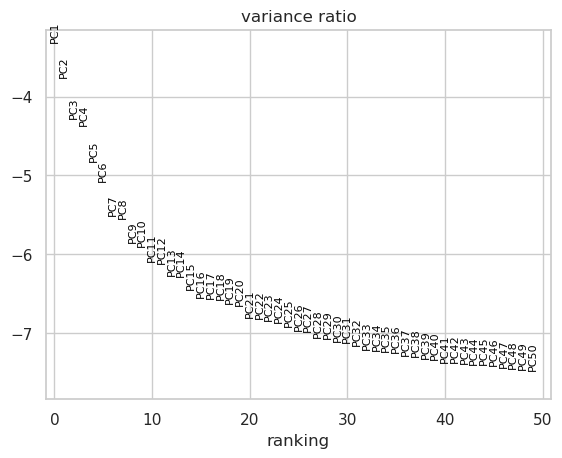

In [31]:
#Scale genes
sc.pp.scale(adata_hvg, max_value=10)

#PCA
sc.tl.pca(adata_hvg, svd_solver="arpack")

#Scree plot (variance explained)
sc.pl.pca_variance_ratio(adata_hvg, log=True, n_pcs=50)

in this article: Chen Z, Goldwasser J, Tuckman P, Liu J, Zhang J, Gerstein M. Forest Fire Clustering for single-cell sequencing combines iterative label propagation with parallelized Monte Carlo simulations. Nat Commun. 2022 Jun 20;13(1):3538. doi: 10.1038/s41467-022-31107-8. PMID: 35725981; PMCID: PMC9209427.

they choose the first 30 PCA:  "After normalization and standardization, the first 30 principal components were used for clustering."

i will stick to this:

“For each sample, I used the first 30 principal components for neighbor graph construction and UMAP, following common practice in single‑cell analyses where 20–40 PCs are typically sufficient to capture biological signal while later PCs explain minimal additional variance.”

## UMAP and clustering

- sc.tl.umap(adata) runs UMAP on the neighbor graph to get a 2‑D embedding for visualization.
- sc.pl.umap(adata) plots cells in UMAP space (no colors yet).
- sc.tl.leiden(adata, resolution=0.5) runs Leiden community detection on the neighbor graph, assigning each cell to a cluster (stored in adata.obs['leiden']).
- sc.pl.umap(adata, color=['leiden']) shows the UMAP with clusters colored, letting me see discrete populations

In [ ]:
#takes around 1-2 minutes
sc.tl.pca(adata_hvg, svd_solver="arpack")
sc.pp.neighbors(adata_hvg, n_pcs=30)
sc.tl.umap(adata_hvg)

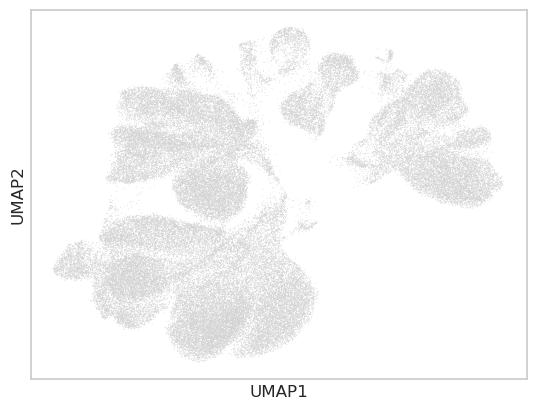

In [33]:
sc.pl.umap(adata_hvg, color=None)

I have a clean UMAP embedding with multiple well‑separated lobes, so the 30‑PC setup is behaving reasonably and capturing structure instead of pure noise.

The points are all grey because I set color=None; once I cluster, I can color by leiden or by marker genes to see whether these lobes correspond to meaningful cell types or technical effects.

/triumvirate/apps/.scratch/alexarol/ipykernel_249655/179342548.py:1: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(adata_hvg, resolution=0.5)


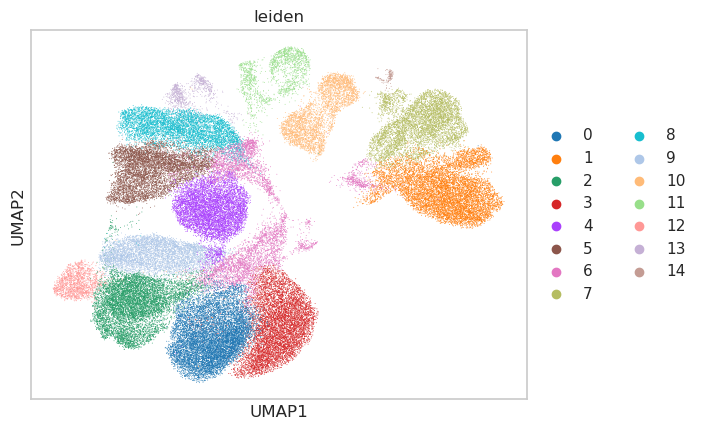

In [34]:
sc.tl.leiden(adata_hvg, resolution=0.5)
sc.pl.umap(adata_hvg, color="leiden")

Now have clear clusters.

Each color is one Leiden cluster; the legend on the right (0–14) shows the cluster IDs stored in adata_hvg.obs["leiden"].
​
Right now the colors are just labels, not biology; the next step is to overlay metadata and marker genes to interpret what each cluster is.


### Check batches/samples/subtypes on the UMAP

In [35]:
adata_hvg.obs.columns

Index(['n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt',
       'total_counts_ribo', 'pct_counts_ribo', 'leiden'],
      dtype='object')

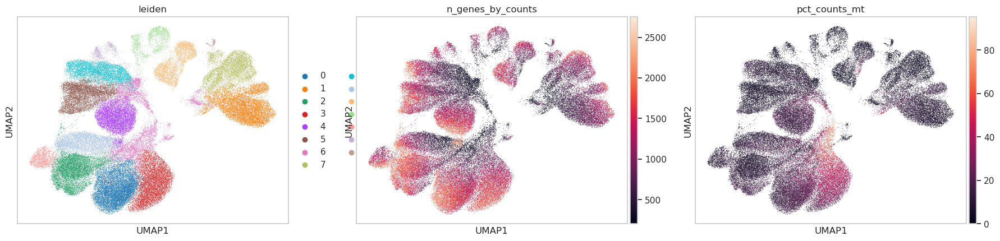

In [36]:
sc.pl.umap(adata_hvg, color=["leiden", "n_genes_by_counts", "pct_counts_mt"])

In [37]:
adata_hvg.obs["pct_counts_mt"].describe()
adata_hvg.obs.groupby("leiden")["pct_counts_mt"].mean().sort_values()

/triumvirate/apps/.scratch/alexarol/ipykernel_249655/4119241638.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  adata_hvg.obs.groupby("leiden")["pct_counts_mt"].mean().sort_values()


leiden
14     0.851129
11     3.309242
7      3.781714
13     4.133259
5      5.353595
10     6.023459
8      7.804542
12     9.010481
1      9.068112
2      9.706901
9     11.281526
4     14.098429
0     16.995801
6     20.792533
3     34.705347
Name: pct_counts_mt, dtype: float64

- Most clusters have mean mitochondrial fraction < ~17%.
- Cluster 3 (≈35%) and cluster 6 (≈21%) are the clear high‑mt clusters.

If I want perfect reproducibility of cluster labels across runs, I should:
- Avoid rerunning neighbors/leiden once you’ve “frozen” a result, or
- Save that AnnData (adata_hvg.write_h5ad("..._umap_leiden_frozen.h5ad")) and always work from that file instead of recomputing.

- The Leiden panel shows multiple compact, well‑separated clusters, which coudl suggest the graph and resolution are giving meaningful structure rather than one big blob or extreme over‑fragmentation?
​- The n_genes_by_counts panel shows a gradient across the embedding but not a single “hot” cluster with systematically extreme values, so clusters are not trivially “high‑gene vs low‑gene” artifacts?
​- The pct_counts_mt panel looks mostly low varying; I don’t have a clearly isolated cluster with uniformly very high mitochondrial percentage, which is what I would worry about as a low‑quality cluster?

In [38]:
adata_hvg.write_h5ad("adata_normal_epithelial_HVG_UMAP_leiden_frozen.h5ad")

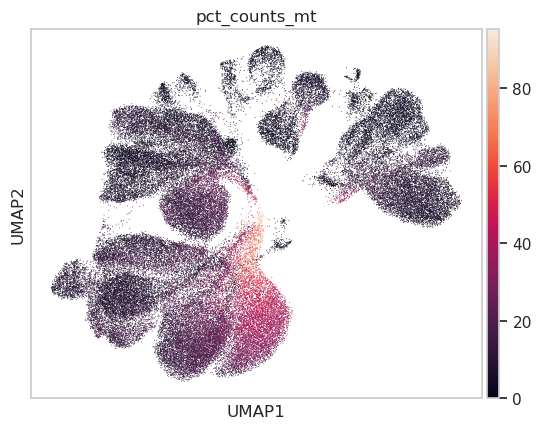

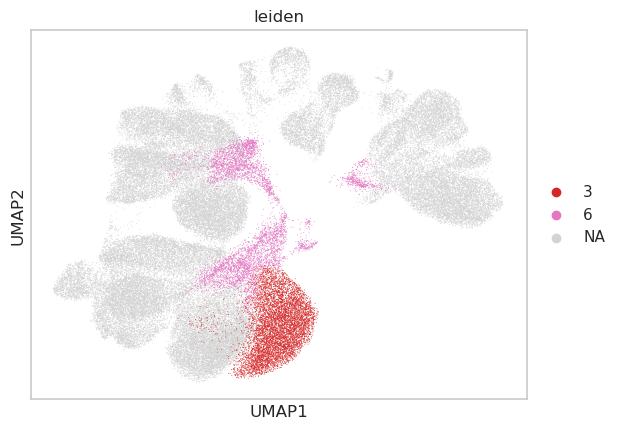

In [39]:
sc.pl.umap(adata_hvg, color="pct_counts_mt")
sc.pl.umap(adata_hvg, color="leiden", groups=["3", "6"])

I dont want to exclude these two clusters since they mught matter later. however i will flag them as high‑mt clusters in .obs, so I can:
- include them when you want to study mitochondrial biology,
- exclude or down‑weight them in analyses where they could be confounding (e.g. broad subtype comparisons).

In [40]:
adata_hvg.obs["high_mt_cluster"] = adata_hvg.obs["leiden"].isin(["3", "6"])

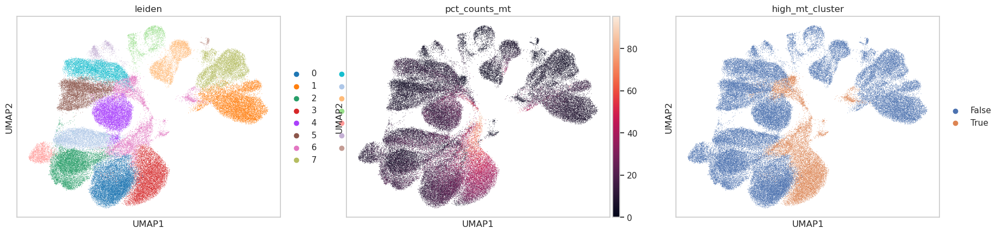

In [41]:
sc.pl.umap(adata_hvg, color=["leiden", "pct_counts_mt", "high_mt_cluster"])

I retained clusters with elevated mitochondrial RNA fractions (Leiden clusters 3 and 6), which likely represent stressed or metabolically altered cells and flagged them using a high‑mt indicator for stratified downstream analyses rather than removing them during QC

/triumvirate/home/alexarol/.conda/envs/breast_cancer_scrnaseq/lib/python3.10/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


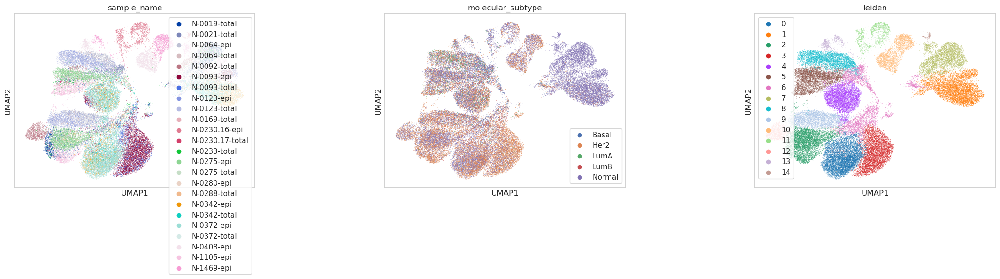

In [42]:
import scanpy as sc

# 1) Load frozen HVG + UMAP + Leiden object
adata_hvg = sc.read_h5ad(
    "/triumvirate/home/alexarol/breast_cancer_analysis/notebooks/adata_normal_epithelial_HVG_UMAP_leiden_frozen.h5ad"
)

# 2) Load full object ONLY to copy metadata
adata = sc.read_h5ad(
    "/triumvirate/home/alexarol/breast_cancer_analysis/results/adata_normal_epithelial_improved.h5ad"
)
adata.obs_names_make_unique()

# 3) Align and copy metadata (no re-clustering)
common_cells = adata_hvg.obs_names.intersection(adata.obs_names)
adata_sub = adata[common_cells].copy()

for col in ["sample_name", "sample_type", "molecular_subtype"]:
    adata_hvg.obs.loc[common_cells, col] = adata_sub.obs[col].values

# 4) Plot with frozen embedding + clusters
sc.pl.umap(
    adata_hvg,
    color=["sample_name", "molecular_subtype", "leiden"],
    wspace=0.4,
    legend_loc="best",
)

here i got a bit confused because is see less data on the UMAP plots.how i interprete this: 

When I did adata.obs_names_make_unique() and then intersected common_cells = adata_hvg.obs_names.intersection(adata.obs_names), I restricted adata_hvg to the cells that exist in both objects with matching barcodes. 
That can legitimately drop some cells (e.g. duplicated or unmatched barcodes), so the new plots can show fewer points.


/triumvirate/home/alexarol/.conda/envs/breast_cancer_scrnaseq/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:484: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
/triumvirate/home/alexarol/.conda/envs/breast_cancer_scrnaseq/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:484: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
/triumvirate/home/alexarol/.conda/envs/breast_cancer_scrnaseq/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:484: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
/triumvirate/home/alexarol/.conda/envs/breast_cancer_scrnaseq/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:484: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
/triumvirate/home/alexarol/.conda/envs/breast_cancer_scrnase

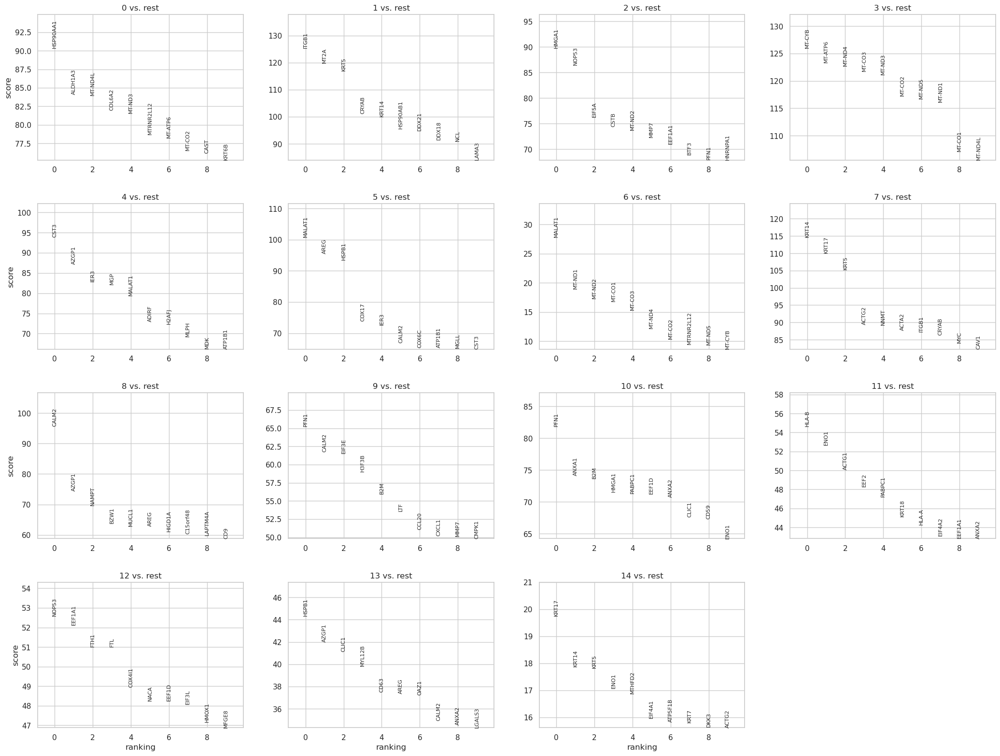

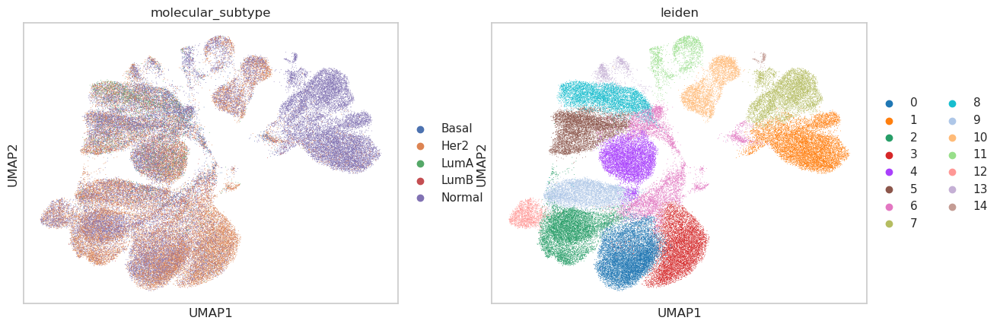

In [43]:
#Check final size
adata_hvg.shape

#Start biological interpretation
sc.tl.rank_genes_groups(adata_hvg, "leiden", method="wilcoxon")
sc.pl.rank_genes_groups(adata_hvg, n_genes=10, sharey=False)

#UMAP colored by subtype + clusters
sc.pl.umap(adata_hvg, color=["molecular_subtype", "leiden"])

next step in SANDBOMICS is: formally define marker genes per cluster and use them (plus prior signatures) to assign the biological identity of each cluster.

using DE per Leiden cluster to 1) define marker genes and 2) assign human‑readable cell type labels to clusters.

what i have done: 
- Performed clustering on the Normal epithelial sample (HVG, PCA, neighbors, UMAP, Leiden).
​- Labeled clusters by molecular subtype using prior information from the reference article and breast signatures (PAM50 etc.).
​
I also have:
- Curated immune/stromal marker file (ImmuneMarkers2.txt).
- PAM50 file with Basal/Her2/LumA/LumB/Normal signatures.

I am working per sample (Normal, then others), not on a fully integrated SCVI object.

The idea of the chapter in SANDBOMICS is still important:
- I should have cluster‑specific marker lists for my Normal epithelial clusters.
- I should be able to justify labels (e.g. “cluster 0 expresses KRT14/KRT5 → basal‑like; cluster 1 expresses ESR1/FOXA1 → LumA‑like,” etc.), ideally by formal DE plus marker overlay.

But I do not need:
- The SCVI‑specific parts (markers_scvi, layer='scvi_normalized', model.save), because I am not using SCVI in your current per‑sample pipeline.
- To re‑label everything from scratch if I already have a solid, article‑based labeling strategy.

What I will do: 

For each sample’s adata_hvg (your 3 000‑HVG, UMAP+Leiden object):
- Run Scanpy DE per Leiden cluster
    - Use your existing adata_hvg:
    - sc.tl.rank_genes_groups(adata_hvg, 'leiden', method='wilcoxon')
    - markers = sc.get.rank_genes_groups_df(adata_hvg, None)
    - Filter reasonably: markers = markers[(markers['pvals_adj'] < 0.05) & (markers['logfoldchanges'] > 0.5)]
    - This gives me per‑cluster marker gene lists compatible with myy log‑CP10k data.

- Use your marker files to confirm/adjust labels
- For each Leiden cluster:
    - Look at the top markers (from markers) and overlap them with:
        - PAM50 subtype genes.
        - Immune/fibro/endo signatures, if relevant (for non‑epithelial samples later).
    - I can implement something lightweight: for each cluster, compute enrichment scores or just count overlaps between its top markers and each signature class (e.g. “Basal”, “Her2”, etc.) and confirm that they match your manual labels.
​
- Keep your existing subtype labels, plus a “cell_type” label if useful
    - I already have molecular_subtype in .obs from the article and signatures, i will keep using it as the main label.

- I can then:
- sc.pl.umap(adata_hvg, color=['leiden', 'molecular_subtype', 'cell_type'])
- And show a figure very similar to SANDBOMICS but grounded in your curated signatures.

- No need for SCVI‑specific DE
    Since I am not using SCVI integration or scvi_normalized in this per‑sample setup, I would skip:

markers_scvi = model.differential_expression(...)

layer='scvi_normalized' in plotting.

model.save(...).

Scanpy’s rank_genes_groups on your log‑CP10k HVG matrix is fully acceptable and widely used for marker detection.

In [44]:
#Differential expression per Leiden cluster
sc.tl.rank_genes_groups(adata_hvg, 'leiden', method='wilcoxon')  # uses log-CP10k HVGs in .X
markers = sc.get.rank_genes_groups_df(adata_hvg, None)           # all clusters in one df [web:32]

# basic filtering
markers = markers[(markers['pvals_adj'] < 0.05) &
                  (markers['logfoldchanges'] > 0.5)]

#optional: save for later
markers.to_csv("Normal_leiden_markers_scanpy_wilcoxon_filtered.csv", index=False)

/triumvirate/home/alexarol/.conda/envs/breast_cancer_scrnaseq/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:484: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
/triumvirate/home/alexarol/.conda/envs/breast_cancer_scrnaseq/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:484: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
/triumvirate/home/alexarol/.conda/envs/breast_cancer_scrnaseq/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:484: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
/triumvirate/home/alexarol/.conda/envs/breast_cancer_scrnaseq/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:484: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
/triumvirate/home/alexarol/.conda/envs/breast_cancer_scrnase

For signature overlap (Normal example, PAM50 only)

In [45]:
#load PAM50 signatures
pam50 = pd.read_csv(
    "/triumvirate/home/alexarol/breast_cancer_analysis/HumanBreast10X-main/Signatures/PAM50.txt",
    sep="\t"
)
pam50_groups = pam50.groupby("Subtype")["Gene"].apply(set).to_dict()

cluster_summaries = []
for cl in sorted(adata_hvg.obs["leiden"].unique(), key=str):
    cl_markers = markers[markers["group"] == cl].copy()
    cl_markers = cl_markers.sort_values("logfoldchanges", ascending=False)

    # use all filtered markers for that cluster
    cl_genes = cl_markers["names"].tolist()
    top_set = set(cl_genes)

    overlap_counts = {
        subtype: len(top_set & genes)
        for subtype, genes in pam50_groups.items()
    }

    best_subtype = max(overlap_counts, key=overlap_counts.get)
    cluster_summaries.append({
        "cluster": cl,
        "best_pam50_subtype": best_subtype,
        **overlap_counts
    })

cluster_summaries = pd.DataFrame(cluster_summaries)
cluster_summaries.to_csv("Normal_leiden_PAM50_overlap_summary.csv", index=False)
print(cluster_summaries)

   cluster best_pam50_subtype  Basal  Her2  LumA  LumB  Normal
0        0              Basal      0     0     0     0       0
1        1              Basal      0     0     0     0       0
2       10              Basal      0     0     0     0       0
3       11              Basal      0     0     0     0       0
4       12              Basal      0     0     0     0       0
5       13              Basal      0     0     0     0       0
6       14              Basal      0     0     0     0       0
7        2              Basal      0     0     0     0       0
8        3              Basal      0     0     0     0       0
9        4              Basal      0     0     0     0       0
10       5              Basal      0     0     0     0       0
11       6              Basal      0     0     0     0       0
12       7              Basal      0     0     0     0       0
13       8              Basal      0     0     0     0       0
14       9              Basal      0     0     0     0 

In [46]:
pam50_genes = set(pam50["Gene"])
adata_genes = set(adata_hvg.var_names)

present = pam50_genes & adata_genes
missing = pam50_genes - adata_genes

print("PAM50 present:", len(present))
print("PAM50 missing:", len(missing))
print("Present:", present)
print("Missing:", missing)

PAM50 present: 13
PAM50 missing: 37
Present: {'KRT5', 'MDM2', 'CDH3', 'GRB7', 'BAG1', 'EGFR', 'ERBB2', 'BLVRA', 'PHGDH', 'KRT14', 'MLPH', 'MYC', 'KRT17'}
Missing: {'TYMS', 'SFRP1', 'FOXC1', 'EXO1', 'FOXA1', 'SLC39A6', 'MYBL2', 'ESR1', 'NAT1', 'ACTR3B', 'UBE2T', 'UBE2C', 'BIRC5', 'MMP11', 'NDC80', 'KIF2C', 'GPR160', 'CEP55', 'CDC6', 'CDC20', 'CXXC5', 'BCL2', 'CENPF', 'MKI67', 'PGR', 'MELK', 'ANLN', 'FGFR4', 'CCNE1', 'MAPT', 'TMEM45B', 'PTTG1', 'NUF2', 'MIA', 'CCNB1', 'ORC6L', 'RRM2'}


Most PAM50 genes are simply not in your 3 000‑HVG Normal object, so PAM50 overlap will not be a reliable driver of cluster labels here.

That’s because:
I capped at 10 000 genes for Normal, then further down‑selected to 3 000 HVGs for clustering.
​
Many PAM50 genes are not among the top‑variance genes in Normal epithelium, so they were dropped before adata_hvg was built.

Given this, the PAM50 overlap on cluster markers from adata_hvg will be:
- Sparsely informed (only 13 possible matches).
- Potentially misleading if you try to pick “best subtype” from essentially no signal.

Thoughts on what to do?

I have molecular_subtype in .obs based on the original paper and a proper PAM50 pipeline on the full gene space, not only HVGs.
​
My current goal for this chapter is:
- Get marker lists per Leiden cluster (for interpretation and write‑up).
- Maybe sanity‑check that clusters are broadly compatible with your existing subtype labels.

So i will: 
- Keep the DE step and marker tables
- Drop the automated PAM50 overlap‑driven labeling for this Normal HVG object
- Use simple marker overlays + existing labels for sanity checks

I am already almost there; I just need to 
(1) guard against the useless PAM50 overlap
(2) add the plots + optional cell_type column.



In [47]:
#Run DE
sc.tl.rank_genes_groups(adata_hvg, 'leiden', method='wilcoxon')

#Let Scanpy filter markers using expression fractions + fold-change
sc.tl.filter_rank_genes_groups(
    adata_hvg,
    groupby='leiden',
    min_in_group_fraction=0.1,   #in ≥10% of cells in the cluster
    max_out_group_fraction=0.05, #in ≤5% of cells outside
    min_fold_change=1.0          #≥2-fold higher in the cluster
)

#Extract filtered markers
markers = sc.get.rank_genes_groups_df(adata_hvg, None)
markers.to_csv("Normal_leiden_markers_filtered_scanpy_default.csv", index=False)

print(markers.shape)
print(markers['group'].value_counts())
print(markers['names'].nunique())


/triumvirate/home/alexarol/.conda/envs/breast_cancer_scrnaseq/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:484: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
/triumvirate/home/alexarol/.conda/envs/breast_cancer_scrnaseq/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:484: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
/triumvirate/home/alexarol/.conda/envs/breast_cancer_scrnaseq/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:484: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
/triumvirate/home/alexarol/.conda/envs/breast_cancer_scrnaseq/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:484: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
/triumvirate/home/alexarol/.conda/envs/breast_cancer_scrnase

(45000, 6)
group
0     3000
1     3000
2     3000
3     3000
4     3000
5     3000
6     3000
7     3000
8     3000
9     3000
10    3000
11    3000
12    3000
13    3000
14    3000
Name: count, dtype: int64
3000


- markers.shape = (45000, 6)
    - I  have 3 000 genes × 15 clusters = 45 000 gene–cluster entries remaining after filter_rank_genes_groups.
​
- group value_counts() shows:
    - Each Leiden cluster (0–14) has 3 000 rows.
    - That means for every cluster, i have all 3 000 HVGs ranked, with associated scores, logfoldchanges, pvals, etc. filter_rank_genes_groups stores the filtered result back into adata.uns['rank_genes_groups'], but get_rank_genes_groups_df(..., None) still returns all ranks per cluster.

- markers['names'].nunique() = 3000
    - All 3 000 HVGs appear at least once as a marker in some cluster (which is expected: it’s a ranking per group).

The big difference from before is:
- Before, my manual p_adj/logFC filter left only 2 rows (too strict).
- Now, I have a full ranked marker list per cluster; I will typically then take top N markers per cluster for interpretation and plots.

Next, I should 
1) distill these 45 000 ranks into a small “top markers per cluster” table, and 
2) use that plus UMAP plots to interpret and (optionally) label clusters. 

That’s the functional equivalent of the SANDBOMICS “find markers/label cell types” chapter, adapted to my per‑sample pipeline.

NOw i have all HVGs ranked per cluster; for interpretation I want the top 20 per cluster.
WHy 20?

Levitin et al., 2019, De novo gene signature identification from single‐cell RNA‐seq (Nucleic Acids Research). They visualize and interpret clusters using the top twenty genes per factor/cluster in their heatmaps.
​
Relevant quote (paraphrased for my thesis): they show “heatmap of gene scores for each factor and the top twenty genes per factor (rows)”, i.e. they focus on the 20 highest‑scoring genes as the key markers for each factor/cluster.

“For cluster annotation and visualization, we focused on the top 20 differentially expressed genes per cluster, similar to previous single‑cell studies that interpret clusters using the top twenty marker genes per factor or cluster (Levitin et al., 2019).”

Make a compact “top markers per cluster” table

In [48]:
#Get full DE table from last rank_genes_groups call
markers_full = sc.get.rank_genes_groups_df(adata_hvg, None)

print("Full DE table:", markers_full.shape)

top_markers_list = []
for cl in sorted(adata_hvg.obs["leiden"].unique(), key=str):
    cl_df = markers_full[markers_full["group"] == cl].copy()
    #sort by DE score (Wilcoxon statistic), descending
    cl_df = cl_df.sort_values("scores", ascending=False)
    cl_df["cluster"] = cl
    top_markers_list.append(cl_df.head(20))   #top 20 per cluster

top_markers = pd.concat(top_markers_list, ignore_index=True)
top_markers.to_csv("Normal_leiden_top20_markers_per_cluster.csv", index=False)

print(top_markers.head())
print(top_markers["cluster"].value_counts())
print("Unique genes:", top_markers["names"].nunique())

Full DE table: (45000, 6)
  group     names     scores  logfoldchanges  pvals  pvals_adj cluster
0     0  HSP90AA1  90.381737             NaN    0.0        0.0       0
1     0   ALDH1A3  84.100014             NaN    0.0        0.0       0
2     0   MT-ND4L  83.977821             NaN    0.0        0.0       0
3     0    COL6A2  81.983612             NaN    0.0        0.0       0
4     0    MT-ND3  81.601357             NaN    0.0        0.0       0
cluster
0     20
1     20
10    20
11    20
12    20
13    20
14    20
2     20
3     20
4     20
5     20
6     20
7     20
8     20
9     20
Name: count, dtype: int64
Unique genes: 186


A good example:

Levitin et al., 2019, De novo gene signature identification from single‐cell RNA‐seq (Nucleic Acids Research). They visualize and interpret clusters using the top twenty genes per factor/cluster in their heatmaps.
​
Relevant quote (paraphrased for your thesis): they show “heatmap of gene scores for each factor and the top twenty genes per factor (rows)”, i.e. they focus on the 20 highest‑scoring genes as the key markers for each factor/cluster.

“For cluster annotation and visualization, we focused on the top 20 differentially expressed genes per cluster, similar to previous single‑cell studies that interpret clusters using the top twenty marker genes per factor or cluster (Levitin et al., 2019).”



now i have a clean “top 20 markers per Leiden cluster” table for the Normal sample.
- Full DE table: (45000, 6)
- 3 000 HVGs × 15 Leiden clusters = 45 000 gene–cluster DE entries.
​
cluster value_counts() gives 20 for every cluster 0–14

For each Leiden cluster, you kept the 20 highest‑scoring genes (by Wilcoxon statistic).
​
Unique genes: 186

Across all 15×20 = 300 rows, there are 186 distinct genes (some genes are top markers in more than one cluster).

now i will inspect markers per cluster

In [49]:
for cl in ["0", "2", "3"]:
    print(f"\nCluster {cl} top markers (by score):")
    print(
        top_markers[top_markers["cluster"] == cl][
            ["names", "scores", "pvals_adj", "logfoldchanges"]
        ].head(20)
    )


Cluster 0 top markers (by score):
        names     scores  pvals_adj  logfoldchanges
0    HSP90AA1  90.381737        0.0             NaN
1     ALDH1A3  84.100014        0.0             NaN
2     MT-ND4L  83.977821        0.0             NaN
3      COL6A2  81.983612        0.0             NaN
4      MT-ND3  81.601357        0.0             NaN
5   MTRNR2L12  78.738693        0.0             NaN
6     MT-ATP6  78.276756        0.0             NaN
7      MT-CO2  76.573189        0.0             NaN
8        CAST  76.189018        0.0             NaN
9       KRT6B  75.248459        0.0             NaN
10      KRT15  74.696655        0.0             NaN
11        MGP  74.510139        0.0             NaN
12    MT-ATP8  73.716133        0.0             NaN
13      KLK10  73.600510        0.0             NaN
14       MALL  73.387901        0.0             NaN
15     MT-ND6  70.826241        0.0             NaN
16     MT-CYB  70.280464        0.0             NaN
17     EEF1B2  70.036316     

thoughts?
- Cluster 0: HSP90AA1, ALDH1A3, COL6A2, KRT6B, KRT15, MGP, KLK10, etc.
    - Mix of stress/chaperone (HSP90AA1), luminal/secretory‑associated genes (KLK10, ALDH1A3), ECM (COL6A2, MGP), some keratins (KRT6B, KRT15).
    - This could be a more differentiated luminal/ECM‑interacting epithelial population with moderate mitochondrial activity.

- Cluster 2: HMGA1, NOP53, EIF5A, MMP7, EEF1A1, HNRNPA1, EEF2, PABPC1, PI3, etc.
    - Strong transcription/translation machinery and proliferation‑associated markers (HMGA1, NOP53, EIF‑/EEF‑genes, ribosomal/elongation factors), plus MMP7 and PI3.
    - This looks like a more proliferative/active epithelial cluster.

- Cluster 3: A wall of mitochondrial genes (MT‑CYB, MT‑ATP6, MT‑ND4/1/5, MT‑CO1/2/3, MT‑ATP8, etc.) plus PIGR, CHI3L1/2, complement C3, DEFB1, CYP24A1.
    - This fits very well with your earlier finding that cluster 3 is the high‑mitochondrial cluster (mean pct_counts_mt ~35%), likely a stressed or metabolically altered epithelial state.
​

The NaN logfoldchanges are a Scanpy artifact; my ranking is based on scores + pvals_adj, which are clearly informative (very high scores, pvals_adj ~0).


Now I have biologically interpretable top markers per Leiden cluster.

I can:
- Use these lists to describe clusters in your text.
- Plot selected markers on the UMAP to show where these subpopulations sit.

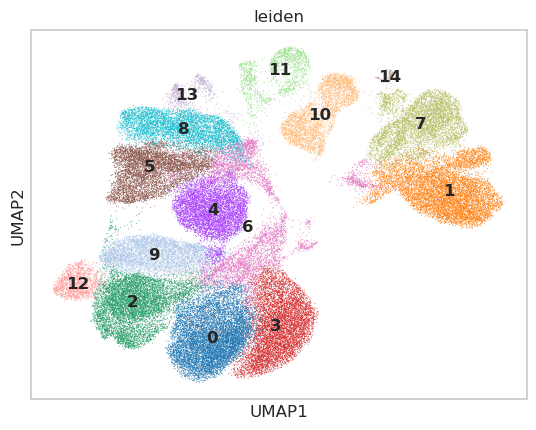

In [50]:
#All clusters as categorical colors
sc.pl.umap(
    adata_hvg,
    color="leiden",
    legend_loc="on data",
    wspace=0.4
)

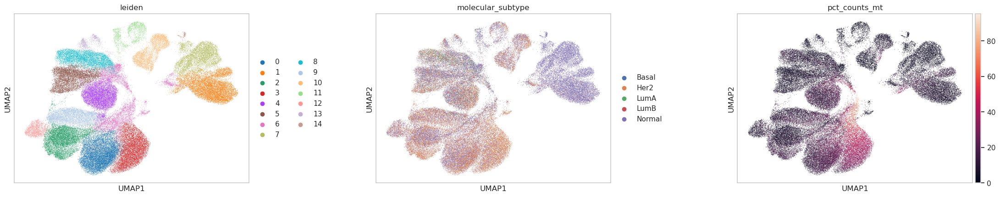

In [51]:
#All clusters as categorical colors + key annotations
sc.pl.umap(
    adata_hvg,
    color=["leiden", "molecular_subtype", "pct_counts_mt"],
    wspace=0.4
)

Genes plotted: ['HSP90AA1', 'ALDH1A3', 'ITGB1', 'MT2A', 'PFN1', 'ANXA1', 'HLA-B', 'ENO1', 'NOP53', 'EEF1A1', 'HSPB1', 'AZGP1', 'KRT17', 'KRT14', 'HMGA1', 'MT-CYB', 'MT-ATP6', 'CST3', 'MALAT1', 'AREG', 'MT-ND1', 'CALM2']


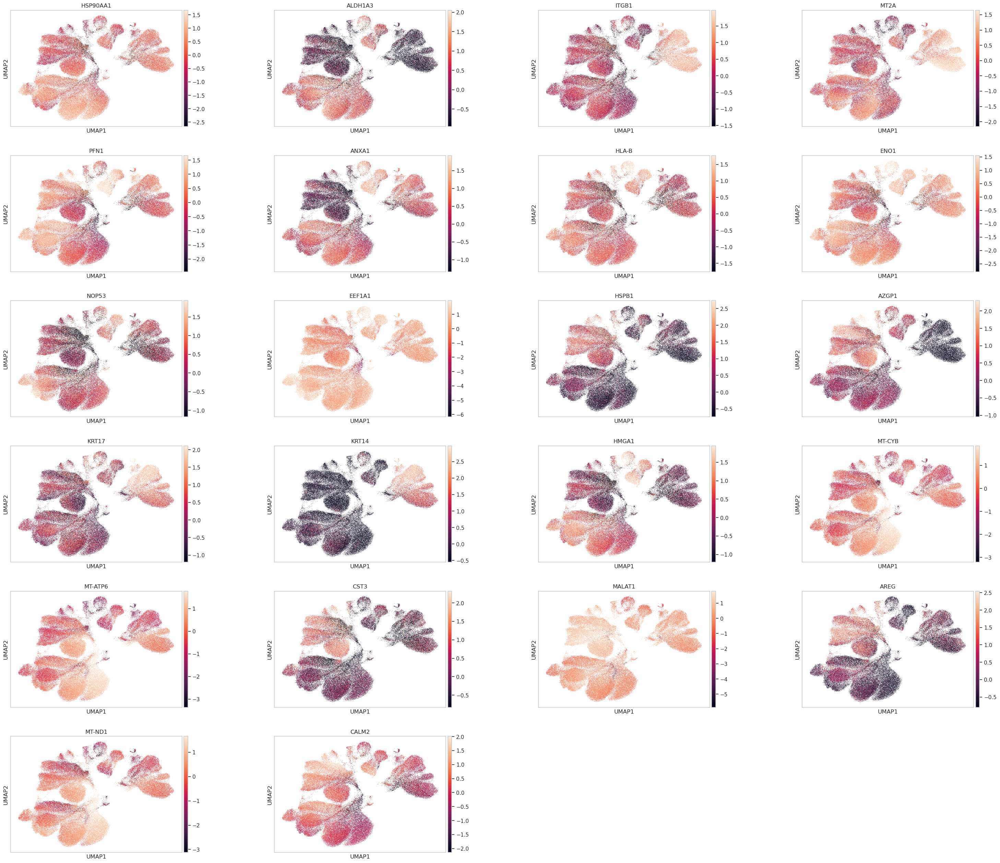

In [52]:
#All clusters plus a compact set of marker genes (across all clusters)
#pick 2 top markers per cluster to keep the panel reasonable
genes_for_plot = []
for cl in sorted(adata_hvg.obs["leiden"].unique(), key=str):
    g = (top_markers[top_markers["cluster"] == cl]
         .sort_values("scores", ascending=False)["names"]
         .head(2)
         .tolist())
    genes_for_plot.extend(g)

#deduplicate and keep only genes present
genes_for_plot = list(dict.fromkeys(g for g in genes_for_plot if g in adata_hvg.var_names))
print("Genes plotted:", genes_for_plot)

if genes_for_plot:
    sc.pl.umap(
        adata_hvg,
        color=genes_for_plot,
        wspace=0.4,
        vmax="p99"
    )

each mini‑UMAP tells me which clusters are defined by which genes; together with Leiden and subtype overlays, they give a biologically grounded interpretation of every Normal epithelial cluster

In [53]:
adata_hvg.obs.columns.tolist()

['n_genes_by_counts',
 'total_counts',
 'total_counts_mt',
 'pct_counts_mt',
 'total_counts_ribo',
 'pct_counts_ribo',
 'leiden',
 'sample_name',
 'sample_type',
 'molecular_subtype']

In [54]:
adata_hvg.obs.head()

,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,total_counts_ribo,pct_counts_ribo,leiden,sample_name,sample_type,molecular_subtype
0,790,1607,287,17.859365,6,0.373367,12,N-0092-total,Normal,Her2
1,275,381,4,1.049869,3,0.787402,6,N-0092-total,Normal,Normal
2,1122,3406,173,5.079272,28,0.822079,7,N-0092-total,Normal,Normal
3,1573,5066,408,8.053691,21,0.414528,12,N-0092-total,Normal,Normal
7,1184,3092,361,11.675291,19,0.614489,12,N-0092-total,Normal,Her2


I already have the key atlas annotations in adata_hvg: sample_name, sample_type, and molecular_subtype. These come from the original paper and can serve as my primary biological labels, while Leiden is just my technical clustering.

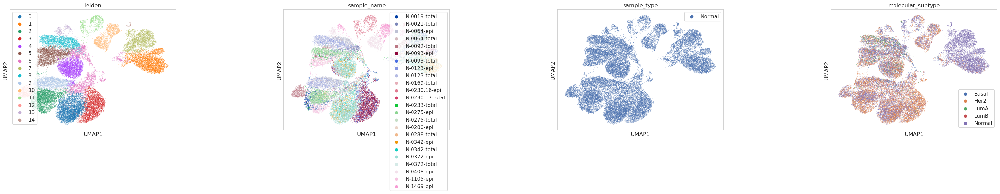

In [55]:
sc.pl.umap(
    adata_hvg,
    color=["leiden", "sample_name", "sample_type", "molecular_subtype"],
    wspace=0.5,
    legend_loc="best"
)

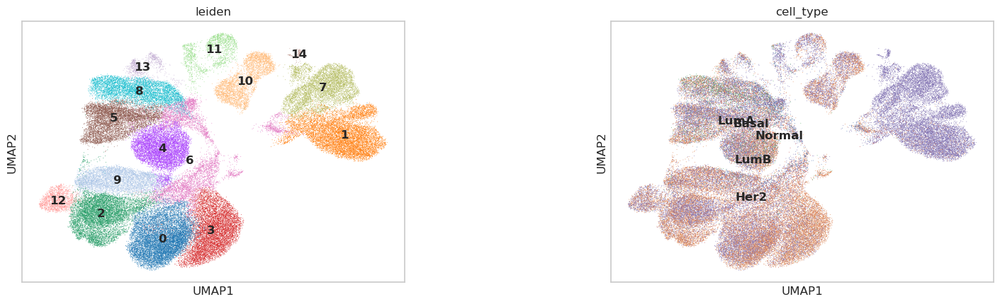

In [56]:
adata_hvg.obs["cell_type"] = adata_hvg.obs["molecular_subtype"].copy()

sc.pl.umap(
    adata_hvg,
    color=["leiden", "cell_type"],
    legend_loc="on data",
    wspace=0.4
)

# Analysis

for each sample, what fraction of cells are each cell type, and how does that differ between conditions?

i will come back to it once i have other samples 


# HEatmap

Genes in heatmap: ['HSP90AA1', 'ALDH1A3', 'MT-ND4L', 'COL6A2', 'MT-ND3', 'ITGB1', 'MT2A', 'KRT5', 'CRYAB', 'KRT14', 'PFN1', 'ANXA1', 'B2M', 'HMGA1', 'PABPC1', 'HLA-B', 'ENO1', 'ACTG1', 'EEF2', 'NOP53', 'EEF1A1', 'FTH1', 'FTL', 'COX4I1', 'HSPB1', 'AZGP1', 'CLIC1', 'MYL12B', 'CD63', 'KRT17', 'MTHFD2', 'EIF5A', 'CSTB', 'MT-ND2', 'MT-CYB', 'MT-ATP6', 'MT-ND4', 'MT-CO3', 'CST3', 'IER3', 'MGP', 'MALAT1', 'AREG', 'COX17', 'MT-ND1', 'MT-CO1', 'ACTG2', 'NNMT', 'CALM2', 'NAMPT', 'BZW1', 'MUCL1', 'EIF3E', 'H3F3B']


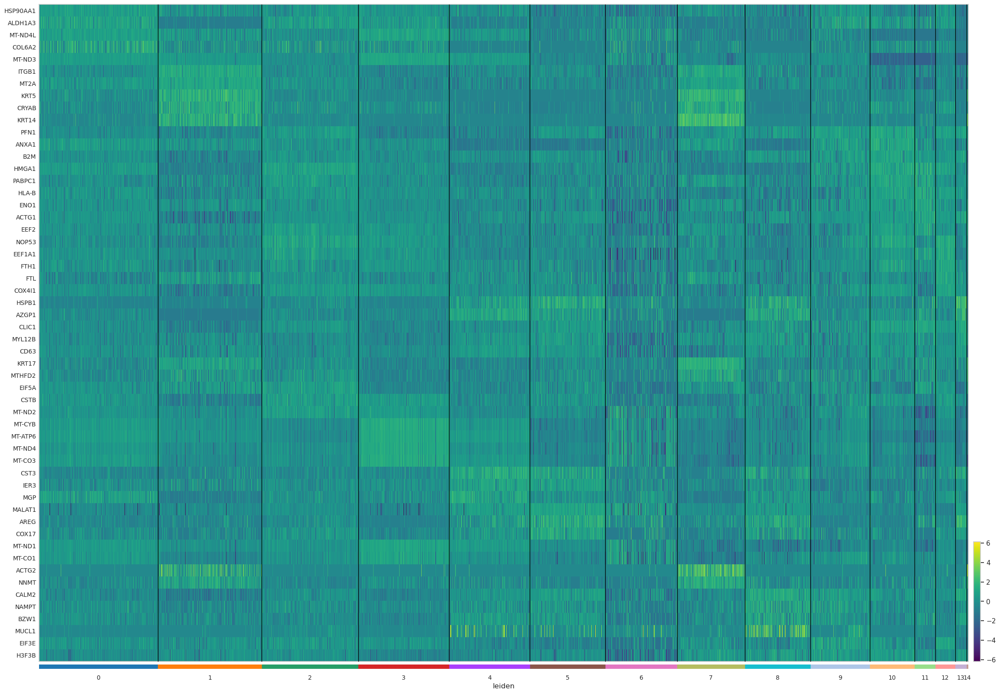

In [57]:
genes_heat = []
for cl in sorted(adata_hvg.obs["leiden"].unique(), key=str):
    g = (top_markers[top_markers["cluster"] == cl]
         .sort_values("scores", ascending=False)["names"]
         .head(5)
         .tolist())
    genes_heat.extend(g)

#deduplicate, keep only present genes
genes_heat = list(dict.fromkeys(g for g in genes_heat if g in adata_hvg.var_names))
print("Genes in heatmap:", genes_heat)

#plot with gene names on y-axis
sc.pl.heatmap(
    adata_hvg,
    var_names=genes_heat,
    groupby="leiden",
    swap_axes=True,           #genes as rows (y-axis labels)
    figsize=(28, 20),          #taller figure for labels
    dendrogram=False,         #optional
    cmap="viridis",
    show=True,
    show_gene_labels=True
)

# Networx


i will focus on those 3000 HVGs i have determined

Input: your Normal_QC_CP10k_log1p_forWGCNA.csv subsetted to the 3 000 HVGs (or directly the 3 000‑gene AnnData matrix).

Orientation: genes as columns, cells as rows for correlation, then Spearman correlation between genes

Threshold: start with something like ∣r∣≥0.6–0.7 to define edges, similar to the 0.7 in the tutorial, but I can tune this based on how dense the Normal network looks

That yields a single Normal gene–gene network where:
- Nodes are HVG genes
- Edges represent strong co‑expression across Normal epithelial cells
- Hub genes (degree, centrality, etc.) are the co‑expression hubs in Normal tissue.

What I want (node size depending on how expressed genes are), for this: 
- Compute a per‑gene expression summary from Normal matrix, e.g. mean log‑CP10k or percent‑of‑cells‑expressing.
- When drawing the network (networkx), pass node_size mapped to that summary: high‑expression genes get larger nodes, low‑expression genes smaller.
- I can still define hubness by degree/centrality, but visually encode expression level separately via node size and, maybe color.

So you will see:
- A global Normal network over 3 000 HVGs.
- Hubs by connectivity.
- Visually larger nodes where genes are highly expressed in Normal epithelial cells

## Load matrix and subset to 3 000 HVGs

What I am doing
- Loading the QC‑filtered, log‑CP10k Normal matrix and restricting it to the 3 000 HVGs that I already selected.

Input:
- Normal_QC_CP10k_log1p_forWGCNA.csv (cells as rows, genes as columns)
- Normal_HVG_3000.txt (one gene symbol per line)

In [58]:
#3-4 minutes
import pandas as pd
import numpy as np

expr_path = "Normal_QC_CP10k_log1p_forWGCNA.csv"
hvg_path = "Normal_HVG_3000.txt"
out_path = "Normal_QC_CP10k_log1p_HVG3000.csv"

#Load HVG list
hvg_genes = pd.read_csv(hvg_path, header=None)[0].astype(str).tolist()

#Prepare streaming over expression file
chunksize = 500   # adjust if needed
first_chunk = True

chunk_iter = pd.read_csv(expr_path, index_col=0, chunksize=chunksize, low_memory=False)

for ch in chunk_iter:
    #Keep only HVG columns that exist in this chunk
    cols = [g for g in hvg_genes if g in ch.columns]
    if not cols:
        continue

    ch_hvg = ch[cols]

    # nsure columns are in the global HVG order
    ch_hvg = ch_hvg.reindex(columns=hvg_genes, fill_value=np.nan)

    #Write or append
    if first_chunk:
        ch_hvg.to_csv(out_path)
        first_chunk = False
    else:
        ch_hvg.to_csv(out_path, mode="a", header=False)

##  Quick shape and head check (chunked)
Checking that the new HVG‑only file has the expected dimensions and sensible values, using only small chunks.

Input: Normal_QC_CP10k_log1p_HVG3000.csv (cells × 3 000 genes, log‑CP10k, HVGs only).

In [59]:
path_hvg = "Normal_QC_CP10k_log1p_HVG3000.csv"

#Peek at first small chunk
chunk_iter = pd.read_csv(path_hvg, index_col=0, chunksize=5, low_memory=False)
first_chunk = next(chunk_iter)

print("First chunk shape:", first_chunk.shape)
print(first_chunk.head())
print("Any NaNs in first chunk?", first_chunk.isna().any().any())

First chunk shape: (5, 3000)
      KRT17      MT2A      MT1X       MGP      MMP7     CXCL1    MT-ND3  \
0  1.977239  4.043139  2.598648  3.469288  4.926536  0.000000  4.546923   
1  3.979559  3.304933  3.304933  0.000000  0.000000  4.378773  0.000000   
2  6.705892  5.977425  3.070467  1.927454  0.000000  1.370164  3.198182   
3  1.934680  3.206290  1.598961  4.452946  4.906964  5.463405  4.304550   
7  1.443183  2.634519  2.010668  2.370473  4.184841  1.443183  4.134349   

       AREG     KRT19     CXCL8  ...  NFYC     AP1S2    ARL13B      PHF1  \
0  0.000000  1.977239  1.977239  ...   0.0  0.000000  0.000000  0.000000   
1  0.000000  0.000000  3.979559  ...   0.0  0.000000  0.000000  0.000000   
2  0.000000  0.000000  1.927454  ...   0.0  1.927454  0.000000  1.370164   
3  3.837315  4.130231  3.206290  ...   0.0  0.000000  1.089889  0.000000   
7  1.443183  0.000000  0.000000  ...   0.0  0.000000  0.000000  0.000000   

   CTDSP1  AKTIP    CCDC9B      MCAT  AP1B1  GATAD2B  
0     0.

- Shape (5, 3000) for the first chunk → rows are cells, columns are 3 000 HVGs.
- Gene names as columns (KRT17, MT2A, MT1X, MMP7, etc.), consistent with epithelial markers and stress/mt genes I’d expect among HVGs.
- Values are non‑negative and in a plausible log1p‑CP10k range (0 for “not expressed”, ~1–7 for expressed genes).

## Check basic summary stats (per‑gene, streaming)

In [60]:
chunksize = 500
n_cells = 0
n_genes = None
gene_sum = None
gene_sq_sum = None

chunk_iter = pd.read_csv(path_hvg, index_col=0, chunksize=chunksize, low_memory=False)

for ch in chunk_iter:
    vals = ch.values.astype(float)
    if n_genes is None:
        n_genes = vals.shape[1]
        gene_sum = np.zeros(n_genes, dtype=np.float64)
        gene_sq_sum = np.zeros(n_genes, dtype=np.float64)

    n = vals.shape[0]
    n_cells += n
    gene_sum += vals.sum(axis=0)
    gene_sq_sum += (vals ** 2).sum(axis=0)

gene_mean = gene_sum / n_cells
gene_var = gene_sq_sum / n_cells - gene_mean**2

print("Mean range:", float(gene_mean.min()), "to", float(gene_mean.max()))
print("Var range:", float(gene_var.min()), "to", float(gene_var.max()))

Mean range: 0.11653940010226922 to 6.269307728765787
Var range: 0.22006121813840523 to 4.169740498616558


- Mean range ≈ 0.12 to 6.27 → some genes are low but non‑zero on average, others are highly and/or broadly expressed across Normal epithelial cells.
- Variance range ≈ 0.22 to 4.17 → all genes have non‑trivial variance, with some showing strong cell‑to‑cell variability

## Correlation 

Keeping biological co‑expression because every step preserves how genes vary across the same cells, just in a numerically safer way:
- I start from log‑CP10k, which is already a biologically standard scale: 
  - each cell is normalized for library size (so cells are comparable), then log‑transformed so fold‑changes are on an approximately linear scale for Pearson. 
  - This is the same scale used for clustering, marker detection, etc. in single‑cell workflows.
​
​In the first pass, I only compute per‑gene mean and variance across all cells. 
- That is exactly what correlation needs; I am not changing the values, just summarizing them so I can reuse those summaries later.
​
In the second pass, for each cell and gene you compute
z ij  =(x ij  −μ  j )/σ  j .
- This is just putting each gene on a comparable scale (how many standard deviations above/below its own mean in that cell), so highly expressed genes don’t dominate purely because of scale. The pattern “which cells are high/low for gene A, and at the same time high/low for gene B” is unchanged.
​
​- The accumulated matrix 
S=∑ i z i ⊤ z i

is exactly the sum used in the definition of Pearson correlation across cells; dividing by ncells  −1 gives the same correlations you’d get if you could afford to compute them on the full matrix in one go.

So chunking/streaming only changes how you traverse the data in RAM, not what numbers you compute. Co‑expression is still “do these two genes go up and down together across cells,” and that is exactly what the Pearson r from this procedure measures.

### First pass - Gene mean and variance (streaming)

In [61]:
filepath = "Normal_QC_CP10k_log1p_HVG3000.csv"
chunksize = 500  #adjust down if needed

# Initialize
ngenes = None
genes_sum = None
genes_qsum = None
n_cells = 0

chunk_iter = pd.read_csv(filepath, index_col=0, chunksize=chunksize, low_memory=False)

for ch in chunk_iter:
    vals = ch.values.astype(np.float32)  #cells × genes, small chunk

    if ngenes is None:
        ngenes = vals.shape[1]
        genes_sum = np.zeros(ngenes, dtype=np.float64)
        genes_qsum = np.zeros(ngenes, dtype=np.float64)

    n = vals.shape[0]
    n_cells += n
    genes_sum += vals.sum(axis=0)
    genes_qsum += (vals ** 2).sum(axis=0)

gene_mean = genes_sum / n_cells
gene_var = genes_qsum / n_cells - gene_mean ** 2
gene_std = np.sqrt(gene_var)
gene_std[gene_std == 0] = 1.0  #avoid division by zero

print("cells:", n_cells, "genes:", ngenes)
print("var range:", gene_var.min(), "to", gene_var.max())

cells: 75923 genes: 3000
var range: 0.22006121892150732 to 4.169740660835389


This pass only holds one small chunk and two 3 000‑length vectors in RAM, which is very light.

### Second pass – accumulate standardized outer products

In [62]:
#Allocate the 3000 x 3000 accumulator once (this is the only big array)
S = np.zeros((ngenes, ngenes), dtype=np.float32)

chunk_iter = pd.read_csv(filepath, index_col=0, chunksize=chunksize, low_memory=False)
colnames = None
n_cells_check = 0

for ch in chunk_iter:
    if colnames is None:
        colnames = ch.columns.to_list()

    vals = ch.values.astype(np.float32)  #cells × genes
    n = vals.shape[0]
    n_cells_check += n

    #standardize per gene: (x - mean) / std
    vals -= gene_mean.astype(np.float32)
    vals /= gene_std.astype(np.float32)

    #accumulate z^T z (genes × cells @ cells × genes → genes × genes)
    S += vals.T @ vals

print("cells seen again:", n_cells_check)

cells seen again: 75923


THE only one chunk plus S live in memory. The outer product per chunk is done with NumPy’s BLAS under the hood, which is efficient.

In [63]:
corr_mat = S / (n_cells - 1)
corr_mat = np.clip(corr_mat, -1.0, 1.0)

print("diag range:",
      float(np.diag(corr_mat).min()),
      "to",
      float(np.diag(corr_mat).max()))

corr_df = pd.DataFrame(corr_mat, index=colnames, columns=colnames)
corr_df.to_csv("Normal_HVG3000_corr_pearson_logCP10k.csv")

diag range: 1.0 to 1.0


diagonal range is good, 1.0 i can proceed with networx

### Sanity check before buildign the network

In [64]:
#Symmetry check
sym_diff = np.abs(corr_mat - corr_mat.T)
print("max |corr - corr.T|:", float(sym_diff.max()))

#Off-diagonal summary (excluding self-correlations)
off_diag = corr_mat.copy()
np.fill_diagonal(off_diag, np.nan)

print("off-diag min:", float(np.nanmin(off_diag)))
print("off-diag max:", float(np.nanmax(off_diag)))
print("off-diag median:", float(np.nanmedian(off_diag)))

#Few random gene pairs
rng = np.random.default_rng(0)
idx = rng.integers(0, corr_mat.shape[0], size=5)
for i, j in zip(idx, idx[::-1]):
    print(colnames[i], colnames[j], "r =", float(corr_mat[i, j]))

max |corr - corr.T|: 0.0
off-diag min: -0.5344736576080322
off-diag max: 0.8075816035270691
off-diag median: 0.025029782205820084
CCDC82 GPAT3 r = 0.04267163574695587
AARS LMAN2 r = 0.0384400300681591
ARFGAP3 ARFGAP3 r = 1.0
LMAN2 AARS r = 0.0384400300681591
GPAT3 CCDC82 r = 0.04267163574695587


Perfect symmetry (max |corr - corr.T|: 0.0) → numerically consistent.

Off‑diagonal range −0.53 to 0.81 with median ≈ 0.025 → most gene pairs are weakly correlated, with a tail of strong positive and some negative correlations. expected, no?

Random pairs show small positive r, and a self‑pair gives r = 1.0 → indexing and alignment are correct.

In [65]:
import networkx as nx
import numpy as np

threshold = 0.5  #or 0.7, similar to the tutorial

G = nx.Graph()

#add nodes (genes)
G.add_nodes_from(colnames)

#add edges where |r| >= threshold (use upper triangle to avoid duplicates)
n_genes = corr_mat.shape[0]
for i in range(n_genes):
    for j in range(i+1, n_genes):
        r = corr_mat[i, j]
        if abs(r) >= threshold:
            G.add_edge(colnames[i], colnames[j], weight=float(r))

print("nodes:", G.number_of_nodes(), "edges:", G.number_of_edges())

nodes: 3000 edges: 92


In [66]:
degrees = dict(G.degree())
top20 = sorted(degrees.items(), key=lambda x: x[1], reverse=True)[:20]

print("Top 20 hub genes by degree (threshold 0.5):")
for g, d in top20:
    print(g, d)

Top 20 hub genes by degree (threshold 0.5):
KRT14 13
MT-ATP6 12
MT-ND3 11
MT-CO2 10
MT-CYB 10
MT-ND1 10
MT-CO3 10
KRT5 9
MT-ND4 9
MT-ND2 8
MT-ND4L 7
MT-ND5 7
MT-CO1 7
MTRNR2L12 5
ACTG2 5
ACTA2 4
MT-ATP8 3
MYLK 3
KRT17 2
MT2A 2


In [67]:
components = list(nx.connected_components(G))
print("Number of connected components:", len(components))

for i, comp in enumerate(components[:10]):
    print(f"Component {i} (size {len(comp)}):", list(comp)[:10])

Number of connected components: 2962
Component 0 (size 16): ['KRT5', 'MEG3', 'CRYAB', 'CAV1', 'ACTG2', 'MSRB3', 'CLMP', 'LAMA3', 'MYLK', 'COL17A1']
Component 1 (size 3): ['MT1X', 'MT2A', 'MT1E']
Component 2 (size 1): ['MGP']
Component 3 (size 1): ['MMP7']
Component 4 (size 1): ['CXCL1']
Component 5 (size 14): ['MT-CO2', 'MTRNR2L12', 'MT-ND4L', 'MT-ND4', 'MTRNR2L8', 'MT-CO1', 'MT-ND5', 'MT-ATP8', 'MT-ND3', 'MT-CYB']
Component 6 (size 2): ['AREG', 'HSPB1']
Component 7 (size 1): ['CXCL8']
Component 8 (size 1): ['ANXA1']
Component 9 (size 1): ['AZGP1']


In [68]:
#G is the graph you already built at threshold 0.5
print("Full Normal network:", "nodes =", G.number_of_nodes(), "edges =", G.number_of_edges())

#pick hub genes by degree
degrees = dict(G.degree())
# sort genes by degree (descending)
sorted_degrees = sorted(degrees.items(), key=lambda x: x[1], reverse=True)

#keep only genes with degree >= 2 (or adjust) and take top 30 for clarity
hub_genes = [g for g, d in sorted_degrees if d >= 2][:30]
print("Selected hub genes:", len(hub_genes))

#build subgraph on hub genes
H = G.subgraph(hub_genes).copy()
print("Hub subgraph:", "nodes =", H.number_of_nodes(), "edges =", H.number_of_edges())

Full Normal network: nodes = 3000 edges = 92
Selected hub genes: 29
Hub subgraph: nodes = 29 edges = 79


In [70]:
from pathlib import Path
import matplotlib.pyplot as plt
import networkx as nx

viz_dir = Path("Normal_network_visualizations")
viz_dir.mkdir(exist_ok=True)

plt.figure(figsize=(12, 10))
pos = nx.spring_layout(H, k=3, iterations=100, seed=42)

deg_H = dict(H.degree())
node_sizes = [300 + 200 * deg_H[n] for n in H.nodes()]
node_colors = "#4ECDC4"

edges = H.edges(data=True)
weights = [abs(d["weight"]) for (_, _, d) in edges]
if len(weights) > 0:
    w_min, w_max = min(weights), max(weights)
    widths = [1 + 4 * (w - w_min) / (w_max - w_min + 1e-10) for w in weights]
else:
    widths = 1

nx.draw_networkx_edges(H, pos, width=widths, alpha=0.5, edge_color="gray")
nx.draw_networkx_nodes(H, pos, node_size=node_sizes,
                       node_color=node_colors, edgecolors="black", linewidths=1.0)
nx.draw_networkx_labels(H, pos, font_size=9)

plt.title("Normal co-expression network\n(hub genes, |r| >= 0.5)", fontsize=14)
plt.axis("off")
plt.tight_layout()

png_file = viz_dir / "normal_hub_network_r>=0.5.png"
plt.savefig(png_file, dpi=300, bbox_inches="tight")
plt.close()

print("Saved network figure:", png_file)

Saved network figure: Normal_network_visualizations/normal_hub_network_r>=0.5.png


In [71]:
import networkx as nx
import numpy as np

threshold = 0.45  #lower than 0.5 → more edges

G = nx.Graph()
G.add_nodes_from(colnames)

n_genes = corr_mat.shape[0]
for i in range(n_genes):
    for j in range(i+1, n_genes):
        r = corr_mat[i, j]
        if abs(r) >= threshold:
            G.add_edge(colnames[i], colnames[j], weight=float(r))

print("nodes:", G.number_of_nodes(), "edges:", G.number_of_edges())

nodes: 3000 edges: 170


In [72]:
import pandas as pd
from pathlib import Path

viz_dir = Path("Normal_network_visualizations")
viz_dir.mkdir(exist_ok=True)

#SIF: gene1 co-expressed gene2
sif_lines = []
edge_rows = []

for u, v, data in G.edges(data=True):
    w = float(data.get("weight", 1.0))
    sif_lines.append(f"{u}\tco-expressed\t{v}")
    edge_rows.append({"gene1": u, "gene2": v, "weight": w, "abs_weight": abs(w)})

sif_file = viz_dir / "normal_coexpression_r>=0.45.sif"
with open(sif_file, "w") as f:
    f.write("\n".join(sif_lines))

attr_file = viz_dir / "normal_coexpression_r>=0.45_edge_attrs.csv"
pd.DataFrame(edge_rows).to_csv(attr_file, index=False)

print("Saved:", sif_file)
print("Saved:", attr_file)

Saved: Normal_network_visualizations/normal_coexpression_r>=0.45.sif
Saved: Normal_network_visualizations/normal_coexpression_r>=0.45_edge_attrs.csv


## Different approach

now i would like to do a bit different, but more clear approach
I already have:
- Normal_QC_CP10k_log1p_HVG3000.csv (cells × 3000 HVGs, log1p CP10k).
- Normal_HVG3000_corr_pearson_logCP10k.csv (3000 × 3000 gene–gene Pearson correlations).
​
I will not throw that away. It’s efficient and numerically correct. What I mainly need is:
- A clean function that:
    - Loads a gene–gene correlation matrix.
    - Thresholds to build a networkx graph.
    - Computes summary metrics, hub genes, and a small visualization.

I can then reuse that for each sample (Normal, HER2, TN, etc.) and later for pairwise comparisons in a separate notebook.

In [ ]:
#Loading correlation matrix
corr_path = "Normal_HVG3000_corr_pearson_logCP10k.csv"
corr_df = pd.read_csv(corr_path, index_col=0)

print(corr_df.shape)
print(corr_df.iloc[:5, :5])

(3000, 3000)
          KRT17      MT2A      MT1X       MGP      MMP7
KRT17  1.000000  0.220100  0.135515 -0.226110 -0.120954
MT2A   0.220100  1.000000  0.741594 -0.128048 -0.181455
MT1X   0.135515  0.741594  1.000000 -0.050520 -0.045731
MGP   -0.226110 -0.128048 -0.050520  1.000000  0.070942
MMP7  -0.120954 -0.181455 -0.045731  0.070942  1.000000


In [78]:
#Building network (no functions)
threshold = 0.45  # adjust as needed

genes = corr_df.index.to_list()
C = corr_df.values.astype(float)
n_genes = C.shape[0]

G = nx.Graph()
G.add_nodes_from(genes)

for i in range(n_genes):
    for j in range(i + 1, n_genes):
        r = C[i, j]
        if abs(r) >= threshold:
            G.add_edge(genes[i], genes[j], weight=float(r))

print("Nodes:", G.number_of_nodes())
print("Edges:", G.number_of_edges())

Nodes: 3000
Edges: 170


In [79]:
#Summarizing hubs
degrees = dict(G.degree())
n_nodes = G.number_of_nodes()
n_edges = G.number_of_edges()
density = nx.density(G)
clustering = nx.average_clustering(G) if n_nodes > 1 else np.nan

print(f"Normal (|r| ≥ {threshold}):")
print("  Nodes:", n_nodes)
print("  Edges:", n_edges)
print(f"  Density: {density:.4f}")
print(f"  Avg clustering: {clustering:.4f}")

top20 = sorted(degrees.items(), key=lambda x: x[1], reverse=True)[:20]
print("\nTop 20 hub genes:")
for g, d in top20:
    print(f"  {g}: degree {d}")

Normal (|r| ≥ 0.45):
  Nodes: 3000
  Edges: 170
  Density: 0.0000
  Avg clustering: 0.0128

Top 20 hub genes:
  KRT14: degree 23
  KRT5: degree 18
  MT-ND3: degree 13
  MT-CO3: degree 13
  MT-ATP6: degree 12
  MT-CYB: degree 12
  ACTG2: degree 12
  MT-CO2: degree 11
  MT-ND1: degree 11
  MT-ND4L: degree 10
  MT-ND5: degree 10
  MT-ND4: degree 10
  MTRNR2L12: degree 9
  MT-CO1: degree 9
  ACTA2: degree 9
  KRT18: degree 8
  MT-ND2: degree 8
  MT-ATP8: degree 6
  MMP7: degree 5
  CAV1: degree 5


Network density is 2E/(N(N−1)). With 3000 nodes and 92 edges, 2×92/(3000×2999)≈2×92/9,0×10`6 ≈2×10`−5 , which rounds to 0.0000 at 4 decimals.
​

In [80]:
#Ploting a small hub subgraph
import matplotlib.pyplot as plt
from pathlib import Path

viz_dir = Path("Normal_network_visualizations")
viz_dir.mkdir(exist_ok=True)

min_degree = 2
max_nodes = 30

#select hub nodes
sorted_degrees = sorted(degrees.items(), key=lambda x: x[1], reverse=True)
hubs = [g for g, d in sorted_degrees if d >= min_degree][:max_nodes]

H = G.subgraph(hubs).copy()
print("Hub subgraph:", H.number_of_nodes(), "nodes,", H.number_of_edges(), "edges")

if H.number_of_nodes() > 0:
    plt.figure(figsize=(10, 8))
    pos = nx.spring_layout(H, k=2, iterations=100, seed=42)

    deg_H = dict(H.degree())
    node_sizes = [300 + 150 * deg_H[n] for n in H.nodes()]
    node_colors = "#4ECDC4"

    edges = H.edges(data=True)
    weights = [abs(d["weight"]) for (_, _, d) in edges]
    if len(weights) > 0:
        w_min, w_max = min(weights), max(weights)
        widths = [1 + 3 * (w - w_min) / (w_max - w_min + 1e-10) for w in weights]
    else:
        widths = 1

    nx.draw_networkx_edges(H, pos, width=widths, alpha=0.5, edge_color="gray")
    nx.draw_networkx_nodes(H, pos, node_size=node_sizes,
                           node_color=node_colors, edgecolors="black", linewidths=0.8)
    nx.draw_networkx_labels(H, pos, font_size=8)

    plt.title(f"Normal co-expression network (hub genes, |r| ≥ {threshold})")
    plt.axis("off")
    plt.tight_layout()

    png_file = viz_dir / f"Normal_hub_network_r{threshold}.png"
    plt.savefig(png_file, dpi=300, bbox_inches="tight")
    plt.close()

    print("Saved network figure:", png_file)

Hub subgraph: 30 nodes, 106 edges
Saved network figure: Normal_network_visualizations/Normal_hub_network_r0.45.png


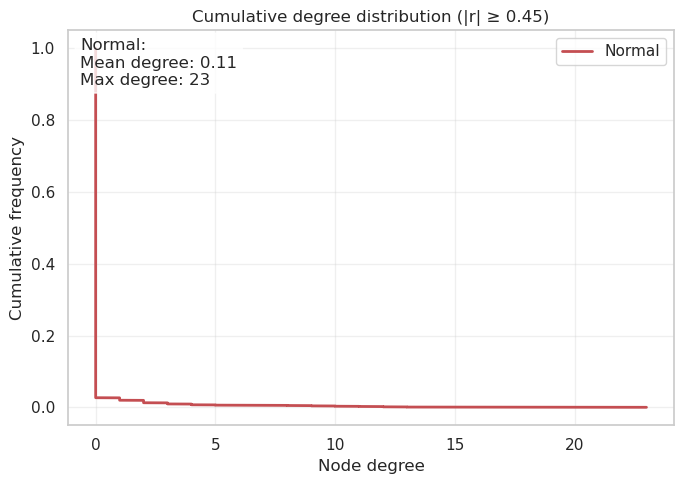

In [81]:
#Cumulative degree distribution
deg_list = sorted([d for _, d in G.degree()], reverse=True)
cumfreq = np.arange(1, len(deg_list) + 1) / len(deg_list)

plt.figure(figsize=(7, 5))
plt.plot(deg_list, cumfreq, 'r-', label='Normal', linewidth=2)

plt.xlabel('Node degree')
plt.ylabel('Cumulative frequency')
plt.title(f'Cumulative degree distribution (|r| ≥ {threshold})')
plt.grid(alpha=0.3)
plt.legend()

mean_deg = np.mean(deg_list)
max_deg = max(deg_list)
txt = f'Normal:\nMean degree: {mean_deg:.2f}\nMax degree: {max_deg}'
plt.text(0.02, 0.98, txt, transform=plt.gca().transAxes,
         va='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))

plt.tight_layout()
plt.show()

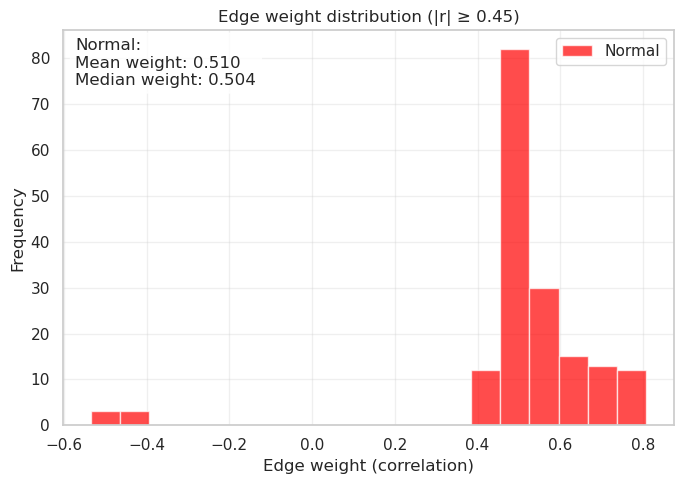

In [82]:
#Edge weight distribution
weights = [d['weight'] for (_, _, d) in G.edges(data=True)]

plt.figure(figsize=(7, 5))
if len(weights) > 0:
    bins = np.linspace(min(weights), max(weights), 20)
    plt.hist(weights, bins=bins, alpha=0.7, color='red', label='Normal')
else:
    print("No edges; nothing to plot.")

plt.xlabel('Edge weight (correlation)')
plt.ylabel('Frequency')
plt.title(f'Edge weight distribution (|r| ≥ {threshold})')
plt.grid(alpha=0.3)
plt.legend()

if weights:
    txt = (f'Normal:\nMean weight: {np.mean(weights):.3f}\n'
           f'Median weight: {np.median(weights):.3f}')
    plt.text(0.02, 0.98, txt, transform=plt.gca().transAxes,
             va='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))

plt.tight_layout()
plt.show()

In [ ]:
#Run DE for all Leiden clusters vs rest
sc.tl.rank_genes_groups(
    adata_hvg,
    groupby="leiden",
    method="t-test_overestim_var",   # or "t-test"
    use_raw=False
)

  cluster      names     scores  pvals_adj
0       0    MT-ND4L  77.595428        0.0
1       0    ALDH1A3  76.936485        0.0
2       0  MTRNR2L12  75.271141        0.0
3       0     COL6A2  74.030281        0.0
4       0   HSP90AA1  70.477654        0.0


/triumvirate/apps/.scratch/alexarol/ipykernel_249655/1541265923.py:11: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  .groupby("cluster")


In [90]:
import pandas as pd

markers_df = sc.get.rank_genes_groups_df(adata_hvg, group=None)
markers_df = markers_df[["group", "names", "scores", "pvals_adj"]]
markers_df = markers_df.rename(columns={"group": "cluster"})

top_n = 20
top_markers = (
    markers_df
    .sort_values(["cluster", "pvals_adj"])
    .groupby("cluster")
    .head(top_n)
    .reset_index(drop=True)
)

top_markers.to_csv("Normal_leiden_top20_markers_per_cluster.csv", index=False)
print(top_markers.head())

  cluster      names     scores  pvals_adj
0       0    MT-ND4L  77.595428        0.0
1       0    ALDH1A3  76.936485        0.0
2       0  MTRNR2L12  75.271141        0.0
3       0     COL6A2  74.030281        0.0
4       0   HSP90AA1  70.477654        0.0


/triumvirate/apps/.scratch/alexarol/ipykernel_249655/1541265923.py:11: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  .groupby("cluster")


In [97]:
markers = pd.read_csv("Normal_leiden_top20_markers_per_cluster.csv")
cluster_id = "2"

cl = markers[markers["cluster"] == cluster_id]

up_sig = cl[cl["scores"] > 0]["names"].tolist()
down_sig = cl[cl["scores"] < 0]["names"].tolist()

In [98]:
up3 = set(up_sig)
down3 = set(down_sig)

for g in G.nodes():
    if g in up3:
        G.nodes[g]["dir_cl3"] = "up"
    elif g in down3:
        G.nodes[g]["dir_cl3"] = "down"
    else:
        G.nodes[g]["dir_cl3"] = "none"

In [99]:
import matplotlib.pyplot as plt
from pathlib import Path

viz_dir = Path("Normal_network_visualizations")
viz_dir.mkdir(exist_ok=True)

min_degree = 2
max_nodes = 30

degrees = dict(G.degree())
sorted_degrees = sorted(degrees.items(), key=lambda x: x[1], reverse=True)
hubs = [g for g, d in sorted_degrees if d >= min_degree][:max_nodes]

H = G.subgraph(hubs).copy()
print("Hub subgraph:", H.number_of_nodes(), "nodes,", H.number_of_edges(), "edges")

if H.number_of_nodes() > 0:
    color_map = {"up": "#E74C3C", "down": "#3498DB", "none": "#95A5A6"}
    node_colors = [color_map[H.nodes[n].get("dir_cl3", "none")] for n in H.nodes()]

    plt.figure(figsize=(10, 8))
    pos = nx.spring_layout(H, k=2, iterations=100, seed=42)

    deg_H = dict(H.degree())
    node_sizes = [300 + 150 * deg_H[n] for n in H.nodes()]

    edges = H.edges(data=True)
    weights = [abs(d["weight"]) for (_, _, d) in edges]
    if len(weights) > 0:
        w_min, w_max = min(weights), max(weights)
        widths = [1 + 3 * (w - w_min) / (w_max - w_min + 1e-10) for w in weights]
    else:
        widths = 1

    nx.draw_networkx_edges(H, pos, width=widths, alpha=0.5, edge_color="gray")
    nx.draw_networkx_nodes(H, pos, node_size=node_sizes,
                           node_color=node_colors, edgecolors="black", linewidths=0.8)
    nx.draw_networkx_labels(H, pos, font_size=8)

    plt.title("Normal co-expression network\n(hubs, colored by cluster 2 up/down)", fontsize=13)
    plt.axis("off")
    plt.tight_layout()

    png_file = viz_dir / "Normal_hub_network_cluster2_updown.png"
    plt.savefig(png_file, dpi=300, bbox_inches="tight")
    plt.close()

    print("Saved:", png_file)

Hub subgraph: 30 nodes, 106 edges
Saved: Normal_network_visualizations/Normal_hub_network_cluster2_updown.png


https://doi.org/10.1093/bib/bbw139

In [100]:
#Detect modules on the gene network
import networkx as nx
from networkx.algorithms import community

#Use the existing G (built at chosen threshold, e.g. 0.45)
communities = community.louvain_communities(G, weight="weight", seed=42, resolution=1.0)

print("Number of modules:", len(communities))
sizes = [len(c) for c in communities]
print("Module sizes:", sorted(sizes, reverse=True)[:10])

Number of modules: 2931
Module sizes: [22, 15, 9, 8, 6, 5, 4, 3, 3, 3]


In [ ]:
#assigning a module ID to each gene node
gene_to_module = {}
for m_id, comm in enumerate(communities):
    for g in comm:
        gene_to_module[g] = m_id

nx.set_node_attributes(G, gene_to_module, "module")

In [102]:
#inspecting modeules
import pandas as pd

mod_sizes = pd.Series(gene_to_module).value_counts().sort_values(ascending=False)
print(mod_sizes.head())

# example: get genes in the largest module
largest_module_id = mod_sizes.index[0]
largest_module_genes = [g for g, m in gene_to_module.items() if m == largest_module_id]
print("Largest module:", largest_module_id, "size:", len(largest_module_genes))
print(largest_module_genes[:20])

5      22
15     15
244     9
3       8
269     6
Name: count, dtype: int64
Largest module: 5 size: 22
['KRT5', 'CAV1', 'MSRB3', 'CNN1', 'CLMP', 'COL17A1', 'ACTA2', 'FAM126A', 'KRT14', 'KRT17', 'DKK3', 'MEG3', 'CD200', 'CRYAB', 'ITGB1', 'ACTG2', 'LAMA3', 'MYLK', 'GPC1', 'APOE']


In [103]:
pd.DataFrame(
    {"gene": list(gene_to_module.keys()),
     "module": list(gene_to_module.values())}
).to_csv("Normal_gene_modules_louvain.csv", index=False)

In [104]:
#Functional enrichment per module
#Export per‑module gene lists
from pathlib import Path
import pandas as pd

out_dir = Path("Normal_modules")
out_dir.mkdir(exist_ok=True)

mod_sizes = pd.Series(gene_to_module).value_counts().sort_values(ascending=False)
print("Modules and sizes:\n", mod_sizes.head())

for m_id in mod_sizes.index:
    genes_m = [g for g, m in gene_to_module.items() if m == m_id]
    fn = out_dir / f"Normal_module_{m_id}_genes.txt"
    with open(fn, "w") as f:
        f.write("\n".join(genes_m))
    print(f"Saved module {m_id} ({len(genes_m)} genes) to {fn}")

Modules and sizes:
 5      22
15     15
244     9
3       8
269     6
Name: count, dtype: int64
Saved module 5 (22 genes) to Normal_modules/Normal_module_5_genes.txt
Saved module 15 (15 genes) to Normal_modules/Normal_module_15_genes.txt
Saved module 244 (9 genes) to Normal_modules/Normal_module_244_genes.txt
Saved module 3 (8 genes) to Normal_modules/Normal_module_3_genes.txt
Saved module 269 (6 genes) to Normal_modules/Normal_module_269_genes.txt
Saved module 29 (5 genes) to Normal_modules/Normal_module_29_genes.txt
Saved module 2 (4 genes) to Normal_modules/Normal_module_2_genes.txt
Saved module 0 (3 genes) to Normal_modules/Normal_module_0_genes.txt
Saved module 271 (3 genes) to Normal_modules/Normal_module_271_genes.txt
Saved module 7 (3 genes) to Normal_modules/Normal_module_7_genes.txt
Saved module 789 (2 genes) to Normal_modules/Normal_module_789_genes.txt
Saved module 2904 (1 genes) to Normal_modules/Normal_module_2904_genes.txt
Saved module 2902 (1 genes) to Normal_modules/No

For biologically meaningful module analysis and enrichment:
- I will focus on modules with ≥3–5 genes (e.g. 5, 15, 244, 3, 269, 29, 2, 0, 271, 7, 789).
- Treat 1‑gene modules as “unassigned/singletons” and ignore them for now; they’re probably low‑connectivity genes just above edge threshold, and they’re not “modules” in the sense of the review.

In [105]:
import pandas as pd

mod_sizes = pd.Series(gene_to_module).value_counts()
keep_modules = mod_sizes[mod_sizes >= 3].index.tolist()
print("Modules kept (>=3 genes):", keep_modules)

Modules kept (>=3 genes): [5, 15, 244, 3, 269, 29, 2, 7, 271, 0]


In [106]:
import networkx as nx

module_hubs = {}

for m_id in keep_modules:
    genes_m = [g for g, m in gene_to_module.items() if m == m_id]
    Hm = G.subgraph(genes_m).copy()
    deg = dict(Hm.degree(weight="weight"))
    # sort by degree within the module
    hubs_m = sorted(deg.items(), key=lambda x: x[1], reverse=True)
    module_hubs[m_id] = hubs_m
    print(f"Module {m_id} (n={len(genes_m)}), top hubs:", hubs_m[:5])

Module 5 (n=22), top hubs: [('KRT14', 10.68329728), ('KRT5', 8.32593055), ('ACTG2', 5.7832909699999995), ('ACTA2', 4.7211482799999995), ('CAV1', 2.5975672600000004)]
Module 15 (n=15), top hubs: [('MT-CO3', 8.41680588), ('MT-ATP6', 8.12285814), ('MT-CYB', 7.80324819), ('MT-ND3', 7.80137536), ('MT-CO2', 7.260252459999999)]
Module 244 (n=9), top hubs: [('MMP7', 2.30558997), ('CHI3L2', 1.43754445), ('LTF', 1.41651545), ('CHI3L1', 1.0264186), ('ALDH1A3', 0.9834304600000001)]
Module 3 (n=8), top hubs: [('KRT18', 2.45642162), ('CD24', 1.39586871), ('KRT19', 1.04404498), ('CLDN7', 0.94875057), ('AZGP1', 0.93914256)]
Module 269 (n=6), top hubs: [('NACA', 1.97073386), ('EEF1A1', 1.37805947), ('EEF1B2', 0.9834258600000001), ('FAU', 0.49069068), ('BTF3', 0.489905)]
Module 29 (n=5), top hubs: [('HSP90AB1', 1.43591646), ('NPM1', 0.96109604), ('NCL', 0.93384439), ('HSPD1', 0.92974354), ('DDX21', 0.47688583)]
Module 2 (n=4), top hubs: [('CXCL1', 0.9274819299999999), ('CXCL3', 0.9263243699999999), ('CX

In [107]:
#Selecting only “real” modules (≥3 genes)
import pandas as pd

mod_sizes = pd.Series(gene_to_module).value_counts()
keep_modules = mod_sizes[mod_sizes >= 3].index.tolist()
print("Modules kept (>=3 genes):", keep_modules)
print(mod_sizes[mod_sizes >= 3])

Modules kept (>=3 genes): [5, 15, 244, 3, 269, 29, 2, 7, 271, 0]
5      22
15     15
244     9
3       8
269     6
29      5
2       4
7       3
271     3
0       3
Name: count, dtype: int64


In [108]:
#Computing intra‑module degree hubs
import networkx as nx

module_hubs = []

for m_id in keep_modules:
    genes_m = [g for g, m in gene_to_module.items() if m == m_id]
    Hm = G.subgraph(genes_m).copy()
    
    # degree within this module, weighted by edge weight
    deg = dict(Hm.degree(weight="weight"))
    sorted_deg = sorted(deg.items(), key=lambda x: x[1], reverse=True)
    
    top_k = min(5, len(sorted_deg))  # keep up to 5 hubs per module
    for rank, (gene, d) in enumerate(sorted_deg[:top_k], start=1):
        module_hubs.append({
            "module": m_id,
            "module_size": len(genes_m),
            "hub_rank": rank,
            "gene": gene,
            "intra_module_degree": d
        })

# Save as a table
module_hubs_df = pd.DataFrame(module_hubs)
module_hubs_df.to_csv("Normal_module_level_hubs.csv", index=False)
module_hubs_df.head()

,module,module_size,hub_rank,gene,intra_module_degree
0,5,22,1,KRT14,10.683297
1,5,22,2,KRT5,8.325931
2,5,22,3,ACTG2,5.783291
3,5,22,4,ACTA2,4.721148
4,5,22,5,CAV1,2.597567


In [110]:
#Visualizing individual modules
m_id = 5
genes_m = [g for g, m in gene_to_module.items() if m == m_id]
Hm = G.subgraph(genes_m).copy()
print(Hm.number_of_nodes(), Hm.number_of_edges())

22 54


In [111]:
import matplotlib.pyplot as plt
import networkx as nx
from pathlib import Path

viz_dir = Path("Normal_module_visualizations")
viz_dir.mkdir(exist_ok=True)

deg = dict(Hm.degree(weight="weight"))
node_sizes = [300 + 150 * deg[n] for n in Hm.nodes()]

plt.figure(figsize=(6, 5))
pos = nx.spring_layout(Hm, k=0.6, iterations=200, seed=42)

nx.draw_networkx_edges(Hm, pos, alpha=0.5, edge_color="gray")
nx.draw_networkx_nodes(Hm, pos, node_size=node_sizes, node_color="#6BAED6",
                       edgecolors="black", linewidths=0.8)
nx.draw_networkx_labels(Hm, pos, font_size=8)

plt.title(f"Normal module {m_id} (n={Hm.number_of_nodes()})", fontsize=12)
plt.axis("off")
plt.tight_layout()

plt.savefig(viz_dir / f"Normal_module_{m_id}_network.png", dpi=300)
plt.close()

In [ ]:
#module summaries
import pandas as pd

mh = pd.read_csv("Normal_module_level_hubs.csv")

# For each module, get module size (it is repeated, so just take max)
size_per_mod = mh.groupby("module")["module_size"].max()

# Get top 3 hubs per module as comma‑separated string
def top_hubs(group, k=3):
    g = group.sort_values("hub_rank").head(k)
    return ", ".join(g["gene"].tolist())

hubs_per_mod = mh.groupby("module").apply(top_hubs).rename("top_hubs")

summary = (
    pd.concat([size_per_mod, hubs_per_mod], axis=1)
    .reset_index()
    .rename(columns={"module": "module_id"})
    .sort_values("module_size", ascending=False)
)

summary.head()

/triumvirate/apps/.scratch/alexarol/ipykernel_249655/3827425096.py:14: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  hubs_per_mod = mh.groupby("module").apply(top_hubs).rename("top_hubs")


,module_id,module_size,top_hubs
3,5,22,"KRT14, KRT5, ACTG2"
5,15,15,"MT-CO3, MT-ATP6, MT-CYB"
7,244,9,"MMP7, CHI3L2, LTF"
2,3,8,"KRT18, CD24, KRT19"
8,269,6,"NACA, EEF1A1, EEF1B2"


: 

i will contniute fruther analysis of these results, but as for now i will mirror this pipeline to other 5 samples